**3D UNet, FedProx**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints"
log_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

Checkpoints will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_logs


Reusing TensorBoard on port 6006 (pid 12720), started 6 days, 20:23:15 ago. (Use '!kill 12720' to kill it.)

In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


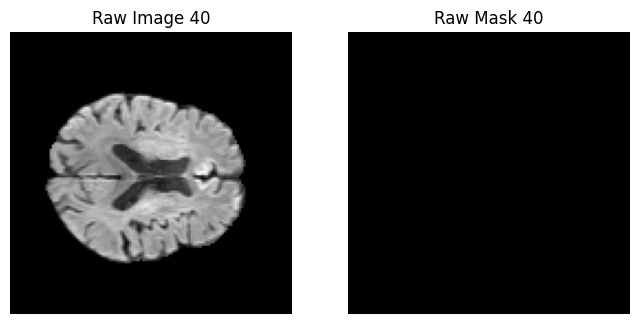

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


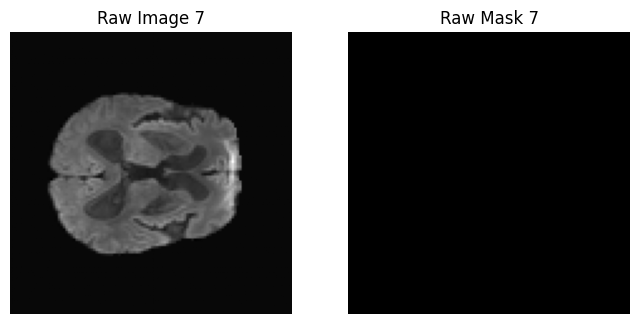

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


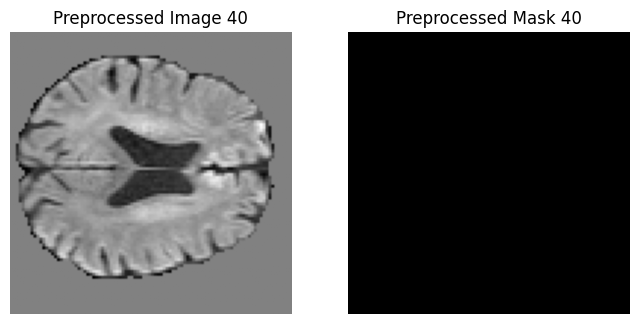

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


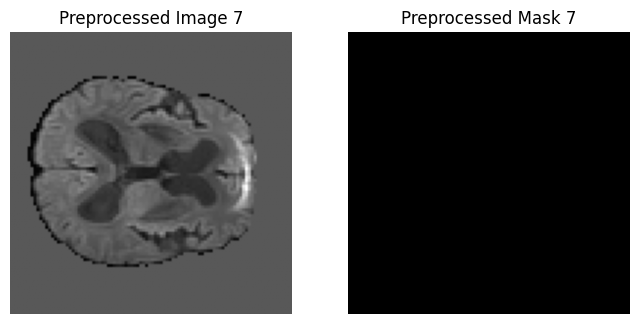

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


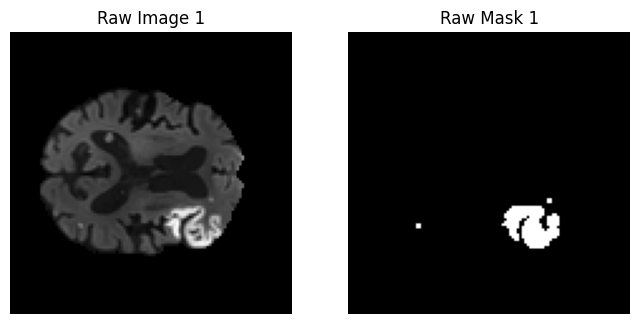

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


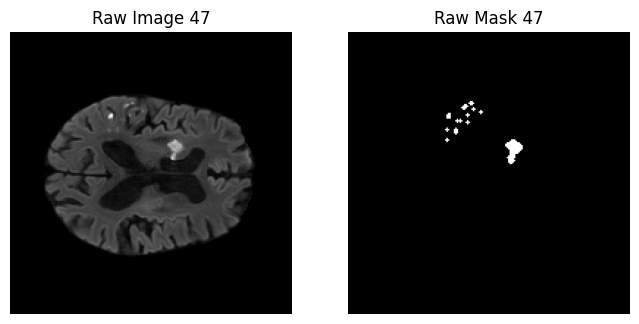

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


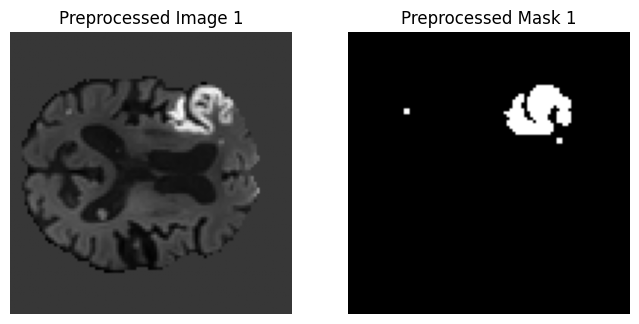

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


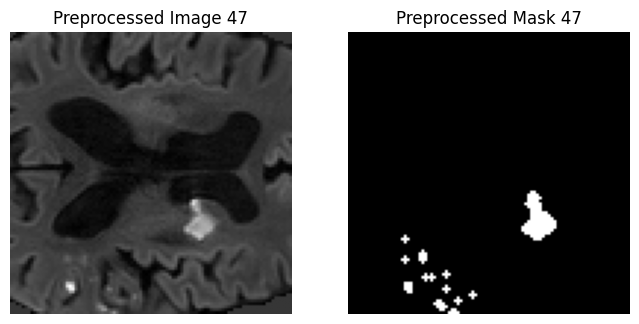

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


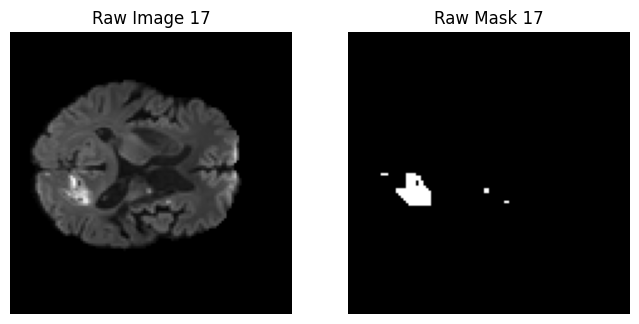

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


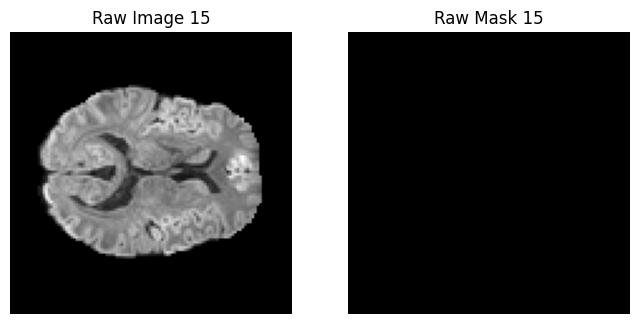

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


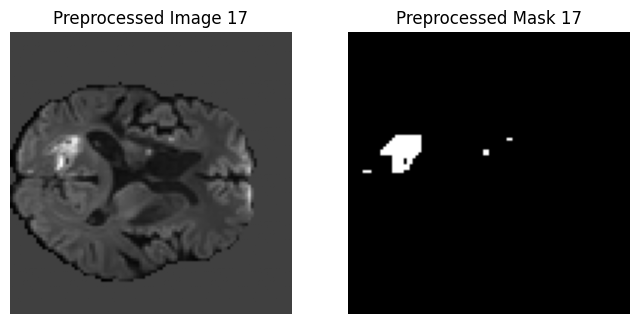

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


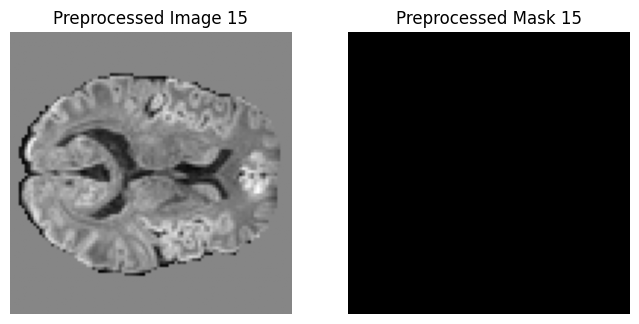

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


UNet

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
    print(model)
    return model

Using device: cuda:0


**Client Class**

In [14]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        
        self.mu = mu   # FedProx coefficient
        
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                
                 # FedProx proximal term
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term
                
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [15]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [16]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [17]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9271 | Dice: 0.0090 | IoU: 0.0045 | HD95: 64.6312


Client 0 | Epoch 2/20 | Loss: 0.9153 | Dice: 0.0187 | IoU: 0.0095 | HD95: 58.5880


Client 0 | Epoch 3/20 | Loss: 0.9117 | Dice: 0.0218 | IoU: 0.0110 | HD95: 56.9871


Client 0 | Epoch 4/20 | Loss: 0.9085 | Dice: 0.0256 | IoU: 0.0130 | HD95: 55.6245


Client 0 | Epoch 5/20 | Loss: 0.9057 | Dice: 0.0291 | IoU: 0.0147 | HD95: 54.1253


Client 0 | Epoch 6/20 | Loss: 0.9036 | Dice: 0.0316 | IoU: 0.0161 | HD95: 52.8397


Client 0 | Epoch 7/20 | Loss: 0.9015 | Dice: 0.0335 | IoU: 0.0170 | HD95: 51.6101


Client 0 | Epoch 8/20 | Loss: 0.8996 | Dice: 0.0347 | IoU: 0.0176 | HD95: 50.4523


Client 0 | Epoch 9/20 | Loss: 0.8976 | Dice: 0.0331 | IoU: 0.0168 | HD95: 50.4457


Client 0 | Epoch 10/20 | Loss: 0.8956 | Dice: 0.0288 | IoU: 0.0146 | HD95: 53.7825


Client 0 | Epoch 11/20 | Loss: 0.8932 | Dice: 0.0215 | IoU: 0.0109 | HD95: 58.8472


Client 0 | Epoch 12/20 | Loss: 0.8884 | Dice: 0.0158 | IoU: 0.0080 | HD95: 61.8335


Client 0 | Epoch 13/20 | Loss: 0.8760 | Dice: 0.0267 | IoU: 0.0135 | HD95: 61.4124


Client 0 | Epoch 14/20 | Loss: 0.8621 | Dice: 0.0407 | IoU: 0.0208 | HD95: 59.1100


Client 0 | Epoch 15/20 | Loss: 0.8499 | Dice: 0.0530 | IoU: 0.0272 | HD95: 56.9972


Client 0 | Epoch 16/20 | Loss: 0.8393 | Dice: 0.0668 | IoU: 0.0345 | HD95: 55.2342


Client 0 | Epoch 17/20 | Loss: 0.8301 | Dice: 0.0833 | IoU: 0.0435 | HD95: 54.6574


Client 0 | Epoch 18/20 | Loss: 0.8221 | Dice: 0.1013 | IoU: 0.0533 | HD95: 52.0795


Client 0 | Epoch 19/20 | Loss: 0.8140 | Dice: 0.1235 | IoU: 0.0658 | HD95: 48.8842


Clients Training:  33%|███▎      | 1/3 [03:04<06:08, 184.05s/it]

Client 0 | Epoch 20/20 | Loss: 0.8071 | Dice: 0.1360 | IoU: 0.0730 | HD95: 44.9794
Client 0 | Loss=0.8774 | Dice=0.1360 | IoU=0.0730 | HD95=44.9794


Client 1 | Epoch 1/20 | Loss: 0.9275 | Dice: 0.0072 | IoU: 0.0036 | HD95: 61.5859


Client 1 | Epoch 2/20 | Loss: 0.9154 | Dice: 0.0152 | IoU: 0.0076 | HD95: 56.7242


Client 1 | Epoch 3/20 | Loss: 0.9115 | Dice: 0.0189 | IoU: 0.0095 | HD95: 54.9976


Client 1 | Epoch 4/20 | Loss: 0.9084 | Dice: 0.0216 | IoU: 0.0109 | HD95: 52.6663


Client 1 | Epoch 5/20 | Loss: 0.9059 | Dice: 0.0249 | IoU: 0.0126 | HD95: 51.7473


Client 1 | Epoch 6/20 | Loss: 0.9037 | Dice: 0.0258 | IoU: 0.0131 | HD95: 51.3048


Client 1 | Epoch 7/20 | Loss: 0.9017 | Dice: 0.0274 | IoU: 0.0139 | HD95: 49.7850


Client 1 | Epoch 8/20 | Loss: 0.8996 | Dice: 0.0280 | IoU: 0.0142 | HD95: 48.6239


Client 1 | Epoch 9/20 | Loss: 0.8975 | Dice: 0.0265 | IoU: 0.0134 | HD95: 50.2430


Client 1 | Epoch 10/20 | Loss: 0.8951 | Dice: 0.0231 | IoU: 0.0117 | HD95: 53.5402


Client 1 | Epoch 11/20 | Loss: 0.8916 | Dice: 0.0165 | IoU: 0.0083 | HD95: 57.7248


Client 1 | Epoch 12/20 | Loss: 0.8826 | Dice: 0.0147 | IoU: 0.0074 | HD95: 59.6766


Client 1 | Epoch 13/20 | Loss: 0.8680 | Dice: 0.0317 | IoU: 0.0161 | HD95: 57.1466


Client 1 | Epoch 14/20 | Loss: 0.8556 | Dice: 0.0453 | IoU: 0.0232 | HD95: 56.1426


Client 1 | Epoch 15/20 | Loss: 0.8448 | Dice: 0.0605 | IoU: 0.0312 | HD95: 56.7452


Client 1 | Epoch 16/20 | Loss: 0.8353 | Dice: 0.0766 | IoU: 0.0398 | HD95: 57.2801


Client 1 | Epoch 17/20 | Loss: 0.8268 | Dice: 0.0955 | IoU: 0.0501 | HD95: 58.2236


Client 1 | Epoch 18/20 | Loss: 0.8185 | Dice: 0.1094 | IoU: 0.0578 | HD95: 57.9772


Client 1 | Epoch 19/20 | Loss: 0.8111 | Dice: 0.1282 | IoU: 0.0685 | HD95: 55.4424


Clients Training:  67%|██████▋   | 2/3 [06:13<03:07, 187.46s/it]

Client 1 | Epoch 20/20 | Loss: 0.8041 | Dice: 0.1459 | IoU: 0.0787 | HD95: 51.7341
Client 1 | Loss=0.8752 | Dice=0.1459 | IoU=0.0787 | HD95=51.7341


Client 2 | Epoch 1/20 | Loss: 0.9257 | Dice: 0.0103 | IoU: 0.0052 | HD95: 63.1373


Client 2 | Epoch 2/20 | Loss: 0.9137 | Dice: 0.0219 | IoU: 0.0111 | HD95: 57.5863


Client 2 | Epoch 3/20 | Loss: 0.9098 | Dice: 0.0263 | IoU: 0.0133 | HD95: 55.8674


Client 2 | Epoch 4/20 | Loss: 0.9067 | Dice: 0.0326 | IoU: 0.0166 | HD95: 53.8641


Client 2 | Epoch 5/20 | Loss: 0.9044 | Dice: 0.0360 | IoU: 0.0183 | HD95: 51.7484


Client 2 | Epoch 6/20 | Loss: 0.9024 | Dice: 0.0397 | IoU: 0.0203 | HD95: 50.1716


Client 2 | Epoch 7/20 | Loss: 0.9006 | Dice: 0.0425 | IoU: 0.0217 | HD95: 49.1942


Client 2 | Epoch 8/20 | Loss: 0.8988 | Dice: 0.0430 | IoU: 0.0220 | HD95: 48.4592


Client 2 | Epoch 9/20 | Loss: 0.8972 | Dice: 0.0430 | IoU: 0.0220 | HD95: 47.7248


Client 2 | Epoch 10/20 | Loss: 0.8956 | Dice: 0.0419 | IoU: 0.0214 | HD95: 48.1781


Client 2 | Epoch 11/20 | Loss: 0.8939 | Dice: 0.0369 | IoU: 0.0188 | HD95: 50.6581


Client 2 | Epoch 12/20 | Loss: 0.8921 | Dice: 0.0297 | IoU: 0.0151 | HD95: 55.1956


Client 2 | Epoch 13/20 | Loss: 0.8883 | Dice: 0.0203 | IoU: 0.0103 | HD95: 59.9275


Client 2 | Epoch 14/20 | Loss: 0.8771 | Dice: 0.0264 | IoU: 0.0134 | HD95: 60.5720


Client 2 | Epoch 15/20 | Loss: 0.8624 | Dice: 0.0449 | IoU: 0.0230 | HD95: 56.4346


Client 2 | Epoch 16/20 | Loss: 0.8501 | Dice: 0.0578 | IoU: 0.0298 | HD95: 53.3471


Client 2 | Epoch 17/20 | Loss: 0.8396 | Dice: 0.0710 | IoU: 0.0368 | HD95: 50.4235


Client 2 | Epoch 18/20 | Loss: 0.8305 | Dice: 0.0866 | IoU: 0.0453 | HD95: 48.5597


Client 2 | Epoch 19/20 | Loss: 0.8219 | Dice: 0.1093 | IoU: 0.0578 | HD95: 50.2758


Client 2 Epochs: 100%|██████████| 20/20 [03:08<00:00,  9.41s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8139 | Dice: 0.1414 | IoU: 0.0761 | HD95: 52.6473
Client 2 | Loss=0.8812 | Dice=0.1414 | IoU=0.0761 | HD95=52.6473


Best global model updated with Dice=0.0580
Global | Val Loss=0.8058 | Dice=0.0580 | IoU=0.0299 | HD95=48.2780
Checkpoint saved for round 1 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7943 | Dice: 0.1407 | IoU: 0.0757 | HD95: 43.6641


Client 0 | Epoch 2/20 | Loss: 0.7864 | Dice: 0.1709 | IoU: 0.0934 | HD95: 39.2686


Client 0 | Epoch 3/20 | Loss: 0.7805 | Dice: 0.1844 | IoU: 0.1016 | HD95: 38.8456


Client 0 | Epoch 4/20 | Loss: 0.7753 | Dice: 0.1691 | IoU: 0.0923 | HD95: 36.5874


Client 0 | Epoch 5/20 | Loss: 0.7700 | Dice: 0.1840 | IoU: 0.1013 | HD95: 35.9429


Client 0 | Epoch 6/20 | Loss: 0.7661 | Dice: 0.1646 | IoU: 0.0897 | HD95: 35.8006


Client 0 | Epoch 7/20 | Loss: 0.7627 | Dice: 0.1626 | IoU: 0.0885 | HD95: 36.8443


Client 0 | Epoch 8/20 | Loss: 0.7579 | Dice: 0.1762 | IoU: 0.0966 | HD95: 34.8810


Client 0 | Epoch 9/20 | Loss: 0.7535 | Dice: 0.1877 | IoU: 0.1036 | HD95: 34.0334


Client 0 | Epoch 10/20 | Loss: 0.7499 | Dice: 0.2051 | IoU: 0.1143 | HD95: 33.0253


Client 0 | Epoch 11/20 | Loss: 0.7467 | Dice: 0.1950 | IoU: 0.1081 | HD95: 33.5382


Client 0 | Epoch 12/20 | Loss: 0.7447 | Dice: 0.1951 | IoU: 0.1081 | HD95: 33.2270


Client 0 | Epoch 13/20 | Loss: 0.7409 | Dice: 0.1986 | IoU: 0.1102 | HD95: 33.1337


Client 0 | Epoch 14/20 | Loss: 0.7379 | Dice: 0.2004 | IoU: 0.1113 | HD95: 32.9441


Client 0 | Epoch 15/20 | Loss: 0.7347 | Dice: 0.2156 | IoU: 0.1208 | HD95: 32.3053


Client 0 | Epoch 16/20 | Loss: 0.7326 | Dice: 0.1958 | IoU: 0.1085 | HD95: 33.3138


Client 0 | Epoch 17/20 | Loss: 0.7302 | Dice: 0.2114 | IoU: 0.1182 | HD95: 32.7444


Client 0 | Epoch 18/20 | Loss: 0.7283 | Dice: 0.2064 | IoU: 0.1151 | HD95: 32.9978


Client 0 | Epoch 19/20 | Loss: 0.7256 | Dice: 0.2183 | IoU: 0.1225 | HD95: 32.5795


Clients Training:  33%|███▎      | 1/3 [01:56<03:52, 116.27s/it]

Client 0 | Epoch 20/20 | Loss: 0.7242 | Dice: 0.2088 | IoU: 0.1166 | HD95: 32.4068
Client 0 | Loss=0.7521 | Dice=0.2088 | IoU=0.1166 | HD95=32.4068


Client 1 | Epoch 1/20 | Loss: 0.7944 | Dice: 0.1439 | IoU: 0.0775 | HD95: 43.3418


Client 1 | Epoch 2/20 | Loss: 0.7869 | Dice: 0.1856 | IoU: 0.1023 | HD95: 39.9660


Client 1 | Epoch 3/20 | Loss: 0.7807 | Dice: 0.1964 | IoU: 0.1089 | HD95: 38.3814


Client 1 | Epoch 4/20 | Loss: 0.7755 | Dice: 0.1885 | IoU: 0.1041 | HD95: 37.3688


Client 1 | Epoch 5/20 | Loss: 0.7707 | Dice: 0.1913 | IoU: 0.1058 | HD95: 34.4800


Client 1 | Epoch 6/20 | Loss: 0.7657 | Dice: 0.2171 | IoU: 0.1218 | HD95: 34.6564


Client 1 | Epoch 7/20 | Loss: 0.7618 | Dice: 0.2023 | IoU: 0.1125 | HD95: 33.5992


Client 1 | Epoch 8/20 | Loss: 0.7575 | Dice: 0.2000 | IoU: 0.1111 | HD95: 33.2847


Client 1 | Epoch 9/20 | Loss: 0.7537 | Dice: 0.2190 | IoU: 0.1230 | HD95: 32.5859


Client 1 | Epoch 10/20 | Loss: 0.7506 | Dice: 0.2138 | IoU: 0.1197 | HD95: 32.6731


Client 1 | Epoch 11/20 | Loss: 0.7473 | Dice: 0.2048 | IoU: 0.1141 | HD95: 31.6383


Client 1 | Epoch 12/20 | Loss: 0.7437 | Dice: 0.2207 | IoU: 0.1241 | HD95: 31.8181


Client 1 | Epoch 13/20 | Loss: 0.7415 | Dice: 0.2211 | IoU: 0.1243 | HD95: 31.2807


Client 1 | Epoch 14/20 | Loss: 0.7386 | Dice: 0.2181 | IoU: 0.1224 | HD95: 31.9389


Client 1 | Epoch 15/20 | Loss: 0.7360 | Dice: 0.2250 | IoU: 0.1268 | HD95: 31.6758


Client 1 | Epoch 16/20 | Loss: 0.7334 | Dice: 0.2234 | IoU: 0.1258 | HD95: 31.4487


Client 1 | Epoch 17/20 | Loss: 0.7310 | Dice: 0.2327 | IoU: 0.1317 | HD95: 31.6575


Client 1 | Epoch 18/20 | Loss: 0.7285 | Dice: 0.2279 | IoU: 0.1286 | HD95: 31.1094


Client 1 | Epoch 19/20 | Loss: 0.7270 | Dice: 0.2209 | IoU: 0.1242 | HD95: 31.9013


Clients Training:  67%|██████▋   | 2/3 [03:58<01:59, 119.76s/it]

Client 1 | Epoch 20/20 | Loss: 0.7243 | Dice: 0.2524 | IoU: 0.1444 | HD95: 31.3479
Client 1 | Loss=0.7524 | Dice=0.2524 | IoU=0.1444 | HD95=31.3479


Client 2 | Epoch 1/20 | Loss: 0.7922 | Dice: 0.1904 | IoU: 0.1052 | HD95: 44.6511


Client 2 | Epoch 2/20 | Loss: 0.7840 | Dice: 0.2272 | IoU: 0.1282 | HD95: 42.7696


Client 2 | Epoch 3/20 | Loss: 0.7777 | Dice: 0.2453 | IoU: 0.1398 | HD95: 40.3672


Client 2 | Epoch 4/20 | Loss: 0.7722 | Dice: 0.2223 | IoU: 0.1250 | HD95: 37.5947


Client 2 | Epoch 5/20 | Loss: 0.7665 | Dice: 0.2604 | IoU: 0.1497 | HD95: 38.6182


Client 2 | Epoch 6/20 | Loss: 0.7621 | Dice: 0.2540 | IoU: 0.1455 | HD95: 35.9675


Client 2 | Epoch 7/20 | Loss: 0.7574 | Dice: 0.2652 | IoU: 0.1528 | HD95: 35.7996


Client 2 | Epoch 8/20 | Loss: 0.7534 | Dice: 0.2673 | IoU: 0.1543 | HD95: 35.4306


Client 2 | Epoch 9/20 | Loss: 0.7490 | Dice: 0.2640 | IoU: 0.1521 | HD95: 34.4754


Client 2 | Epoch 10/20 | Loss: 0.7451 | Dice: 0.2806 | IoU: 0.1632 | HD95: 34.6230


Client 2 | Epoch 11/20 | Loss: 0.7414 | Dice: 0.2958 | IoU: 0.1736 | HD95: 33.6050


Client 2 | Epoch 12/20 | Loss: 0.7381 | Dice: 0.3031 | IoU: 0.1786 | HD95: 33.5086


Client 2 | Epoch 13/20 | Loss: 0.7352 | Dice: 0.2952 | IoU: 0.1732 | HD95: 32.8085


Client 2 | Epoch 14/20 | Loss: 0.7322 | Dice: 0.2901 | IoU: 0.1697 | HD95: 33.0728


Client 2 | Epoch 15/20 | Loss: 0.7294 | Dice: 0.2991 | IoU: 0.1759 | HD95: 32.4281


Client 2 | Epoch 16/20 | Loss: 0.7265 | Dice: 0.3215 | IoU: 0.1915 | HD95: 32.4446


Client 2 | Epoch 17/20 | Loss: 0.7243 | Dice: 0.3017 | IoU: 0.1777 | HD95: 33.3971


Client 2 | Epoch 18/20 | Loss: 0.7221 | Dice: 0.2900 | IoU: 0.1696 | HD95: 32.6563


Client 2 | Epoch 19/20 | Loss: 0.7190 | Dice: 0.3192 | IoU: 0.1899 | HD95: 32.2816


Client 2 Epochs: 100%|██████████| 20/20 [01:59<00:00,  5.97s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7169 | Dice: 0.3268 | IoU: 0.1953 | HD95: 31.6232
Client 2 | Loss=0.7472 | Dice=0.3268 | IoU=0.1953 | HD95=31.6232


Best global model updated with Dice=0.1195
Global | Val Loss=0.7299 | Dice=0.1195 | IoU=0.0636 | HD95=39.1133
Checkpoint saved for round 2 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7180 | Dice: 0.2377 | IoU: 0.1349 | HD95: 32.0356


Client 0 | Epoch 2/20 | Loss: 0.7158 | Dice: 0.2030 | IoU: 0.1130 | HD95: 33.1500


Client 0 | Epoch 3/20 | Loss: 0.7138 | Dice: 0.2099 | IoU: 0.1173 | HD95: 32.6446


Client 0 | Epoch 4/20 | Loss: 0.7114 | Dice: 0.2251 | IoU: 0.1268 | HD95: 31.9893


Client 0 | Epoch 5/20 | Loss: 0.7095 | Dice: 0.2188 | IoU: 0.1228 | HD95: 31.8577


Client 0 | Epoch 6/20 | Loss: 0.7079 | Dice: 0.2274 | IoU: 0.1283 | HD95: 32.1781


Client 0 | Epoch 7/20 | Loss: 0.7065 | Dice: 0.2138 | IoU: 0.1197 | HD95: 32.8580


Client 0 | Epoch 8/20 | Loss: 0.7040 | Dice: 0.2331 | IoU: 0.1319 | HD95: 32.6346


Client 0 | Epoch 9/20 | Loss: 0.7025 | Dice: 0.2451 | IoU: 0.1397 | HD95: 32.0240


Client 0 | Epoch 10/20 | Loss: 0.7009 | Dice: 0.2300 | IoU: 0.1299 | HD95: 32.1104


Client 0 | Epoch 11/20 | Loss: 0.6992 | Dice: 0.2368 | IoU: 0.1343 | HD95: 32.2478


Client 0 | Epoch 12/20 | Loss: 0.6978 | Dice: 0.2384 | IoU: 0.1353 | HD95: 31.8767


Client 0 | Epoch 13/20 | Loss: 0.6966 | Dice: 0.2342 | IoU: 0.1327 | HD95: 32.9115


Client 0 | Epoch 14/20 | Loss: 0.6958 | Dice: 0.2144 | IoU: 0.1201 | HD95: 32.9211


Client 0 | Epoch 15/20 | Loss: 0.6928 | Dice: 0.2366 | IoU: 0.1341 | HD95: 32.1345


Client 0 | Epoch 16/20 | Loss: 0.6925 | Dice: 0.2356 | IoU: 0.1335 | HD95: 32.5277


Client 0 | Epoch 17/20 | Loss: 0.6904 | Dice: 0.2327 | IoU: 0.1317 | HD95: 32.1078


Client 0 | Epoch 18/20 | Loss: 0.6886 | Dice: 0.2201 | IoU: 0.1237 | HD95: 33.1792


Client 0 | Epoch 19/20 | Loss: 0.6863 | Dice: 0.2496 | IoU: 0.1426 | HD95: 32.5258


Clients Training:  33%|███▎      | 1/3 [01:15<02:30, 75.32s/it]

Client 0 | Epoch 20/20 | Loss: 0.6858 | Dice: 0.2427 | IoU: 0.1381 | HD95: 32.7536
Client 0 | Loss=0.7008 | Dice=0.2427 | IoU=0.1381 | HD95=32.7536


Client 1 | Epoch 1/20 | Loss: 0.7190 | Dice: 0.2209 | IoU: 0.1242 | HD95: 31.7669


Client 1 | Epoch 2/20 | Loss: 0.7166 | Dice: 0.2176 | IoU: 0.1221 | HD95: 31.7259


Client 1 | Epoch 3/20 | Loss: 0.7156 | Dice: 0.2180 | IoU: 0.1223 | HD95: 31.2446


Client 1 | Epoch 4/20 | Loss: 0.7126 | Dice: 0.2298 | IoU: 0.1298 | HD95: 30.2267


Client 1 | Epoch 5/20 | Loss: 0.7102 | Dice: 0.2405 | IoU: 0.1367 | HD95: 30.5865


Client 1 | Epoch 6/20 | Loss: 0.7083 | Dice: 0.2743 | IoU: 0.1589 | HD95: 30.9294


Client 1 | Epoch 7/20 | Loss: 0.7076 | Dice: 0.2366 | IoU: 0.1342 | HD95: 31.7249


Client 1 | Epoch 8/20 | Loss: 0.7057 | Dice: 0.2444 | IoU: 0.1392 | HD95: 30.9438


Client 1 | Epoch 9/20 | Loss: 0.7037 | Dice: 0.2410 | IoU: 0.1370 | HD95: 31.0339


Client 1 | Epoch 10/20 | Loss: 0.7020 | Dice: 0.2430 | IoU: 0.1383 | HD95: 31.6264


Client 1 | Epoch 11/20 | Loss: 0.7016 | Dice: 0.2269 | IoU: 0.1280 | HD95: 31.1124


Client 1 | Epoch 12/20 | Loss: 0.6990 | Dice: 0.2523 | IoU: 0.1443 | HD95: 31.0659


Client 1 | Epoch 13/20 | Loss: 0.6985 | Dice: 0.2234 | IoU: 0.1258 | HD95: 31.9820


Client 1 | Epoch 14/20 | Loss: 0.6957 | Dice: 0.2303 | IoU: 0.1301 | HD95: 31.9097


Client 1 | Epoch 15/20 | Loss: 0.6941 | Dice: 0.2545 | IoU: 0.1458 | HD95: 30.9719


Client 1 | Epoch 16/20 | Loss: 0.6922 | Dice: 0.2555 | IoU: 0.1465 | HD95: 31.7566


Client 1 | Epoch 17/20 | Loss: 0.6911 | Dice: 0.2411 | IoU: 0.1371 | HD95: 31.6696


Client 1 | Epoch 18/20 | Loss: 0.6889 | Dice: 0.2423 | IoU: 0.1379 | HD95: 31.5006


Client 1 | Epoch 19/20 | Loss: 0.6876 | Dice: 0.2632 | IoU: 0.1515 | HD95: 31.1933


Clients Training:  67%|██████▋   | 2/3 [02:35<01:18, 78.03s/it]

Client 1 | Epoch 20/20 | Loss: 0.6856 | Dice: 0.2622 | IoU: 0.1509 | HD95: 31.3681
Client 1 | Loss=0.7018 | Dice=0.2622 | IoU=0.1509 | HD95=31.3681


Client 2 | Epoch 1/20 | Loss: 0.7137 | Dice: 0.2718 | IoU: 0.1573 | HD95: 32.5133


Client 2 | Epoch 2/20 | Loss: 0.7104 | Dice: 0.2958 | IoU: 0.1736 | HD95: 32.6347


Client 2 | Epoch 3/20 | Loss: 0.7084 | Dice: 0.2996 | IoU: 0.1762 | HD95: 32.9450


Client 2 | Epoch 4/20 | Loss: 0.7062 | Dice: 0.3261 | IoU: 0.1948 | HD95: 32.4234


Client 2 | Epoch 5/20 | Loss: 0.7030 | Dice: 0.3314 | IoU: 0.1986 | HD95: 31.0508


Client 2 | Epoch 6/20 | Loss: 0.7010 | Dice: 0.3287 | IoU: 0.1967 | HD95: 32.5767


Client 2 | Epoch 7/20 | Loss: 0.6986 | Dice: 0.3387 | IoU: 0.2039 | HD95: 31.9928


Client 2 | Epoch 8/20 | Loss: 0.6963 | Dice: 0.3503 | IoU: 0.2123 | HD95: 31.1606


Client 2 | Epoch 9/20 | Loss: 0.6944 | Dice: 0.3426 | IoU: 0.2067 | HD95: 31.3089


Client 2 | Epoch 10/20 | Loss: 0.6919 | Dice: 0.3478 | IoU: 0.2105 | HD95: 32.9515


Client 2 | Epoch 11/20 | Loss: 0.6900 | Dice: 0.3332 | IoU: 0.1999 | HD95: 32.3527


Client 2 | Epoch 12/20 | Loss: 0.6885 | Dice: 0.3145 | IoU: 0.1866 | HD95: 33.1281


Client 2 | Epoch 13/20 | Loss: 0.6856 | Dice: 0.3313 | IoU: 0.1985 | HD95: 32.3633


Client 2 | Epoch 14/20 | Loss: 0.6845 | Dice: 0.3219 | IoU: 0.1918 | HD95: 30.6937


Client 2 | Epoch 15/20 | Loss: 0.6807 | Dice: 0.3439 | IoU: 0.2076 | HD95: 32.3447


Client 2 | Epoch 16/20 | Loss: 0.6794 | Dice: 0.3261 | IoU: 0.1948 | HD95: 30.7989


Client 2 | Epoch 17/20 | Loss: 0.6760 | Dice: 0.3605 | IoU: 0.2199 | HD95: 29.9525


Client 2 | Epoch 18/20 | Loss: 0.6749 | Dice: 0.3498 | IoU: 0.2120 | HD95: 32.6788


Client 2 | Epoch 19/20 | Loss: 0.6731 | Dice: 0.3391 | IoU: 0.2041 | HD95: 31.5707


Client 2 Epochs: 100%|██████████| 20/20 [01:16<00:00,  3.85s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.6701 | Dice: 0.3431 | IoU: 0.2071 | HD95: 31.4996
Client 2 | Loss=0.6913 | Dice=0.3431 | IoU=0.2071 | HD95=31.4996


Best global model updated with Dice=0.2200
Global | Val Loss=0.6969 | Dice=0.2200 | IoU=0.1236 | HD95=34.7746
Checkpoint saved for round 3 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6806 | Dice: 0.2400 | IoU: 0.1363 | HD95: 33.1218


Client 0 | Epoch 2/20 | Loss: 0.6783 | Dice: 0.2454 | IoU: 0.1399 | HD95: 32.7192


Client 0 | Epoch 3/20 | Loss: 0.6765 | Dice: 0.2312 | IoU: 0.1307 | HD95: 33.1523


Client 0 | Epoch 4/20 | Loss: 0.6737 | Dice: 0.2686 | IoU: 0.1552 | HD95: 32.0399


Client 0 | Epoch 5/20 | Loss: 0.6743 | Dice: 0.2244 | IoU: 0.1264 | HD95: 32.7450


Client 0 | Epoch 6/20 | Loss: 0.6700 | Dice: 0.2502 | IoU: 0.1430 | HD95: 30.9321


Client 0 | Epoch 7/20 | Loss: 0.6708 | Dice: 0.2440 | IoU: 0.1390 | HD95: 32.3844


Client 0 | Epoch 8/20 | Loss: 0.6649 | Dice: 0.2878 | IoU: 0.1681 | HD95: 31.5406


Client 0 | Epoch 9/20 | Loss: 0.6670 | Dice: 0.2559 | IoU: 0.1467 | HD95: 32.2743


Client 0 | Epoch 10/20 | Loss: 0.6628 | Dice: 0.2651 | IoU: 0.1528 | HD95: 32.0168


Client 0 | Epoch 11/20 | Loss: 0.6655 | Dice: 0.2292 | IoU: 0.1294 | HD95: 33.2037


Client 0 | Epoch 12/20 | Loss: 0.6596 | Dice: 0.2861 | IoU: 0.1669 | HD95: 31.6693


Client 0 | Epoch 13/20 | Loss: 0.6579 | Dice: 0.2595 | IoU: 0.1491 | HD95: 30.3314


Client 0 | Epoch 14/20 | Loss: 0.6544 | Dice: 0.2775 | IoU: 0.1611 | HD95: 29.8625


Client 0 | Epoch 15/20 | Loss: 0.6515 | Dice: 0.2995 | IoU: 0.1761 | HD95: 30.1514


Client 0 | Epoch 16/20 | Loss: 0.6506 | Dice: 0.3053 | IoU: 0.1801 | HD95: 28.9757


Client 0 | Epoch 17/20 | Loss: 0.6521 | Dice: 0.2991 | IoU: 0.1758 | HD95: 29.3747


Client 0 | Epoch 18/20 | Loss: 0.6526 | Dice: 0.2436 | IoU: 0.1387 | HD95: 33.1479


Client 0 | Epoch 19/20 | Loss: 0.6454 | Dice: 0.3045 | IoU: 0.1796 | HD95: 30.0945


Clients Training:  33%|███▎      | 1/3 [01:15<02:31, 75.68s/it]

Client 0 | Epoch 20/20 | Loss: 0.6438 | Dice: 0.2906 | IoU: 0.1700 | HD95: 29.7700
Client 0 | Loss=0.6626 | Dice=0.2906 | IoU=0.1700 | HD95=29.7700


Client 1 | Epoch 1/20 | Loss: 0.6802 | Dice: 0.2784 | IoU: 0.1617 | HD95: 31.4696


Client 1 | Epoch 2/20 | Loss: 0.6784 | Dice: 0.2848 | IoU: 0.1660 | HD95: 30.0045


Client 1 | Epoch 3/20 | Loss: 0.6772 | Dice: 0.2592 | IoU: 0.1489 | HD95: 31.4526


Client 1 | Epoch 4/20 | Loss: 0.6739 | Dice: 0.2784 | IoU: 0.1617 | HD95: 31.1817


Client 1 | Epoch 5/20 | Loss: 0.6733 | Dice: 0.2610 | IoU: 0.1501 | HD95: 31.9677


Client 1 | Epoch 6/20 | Loss: 0.6703 | Dice: 0.2913 | IoU: 0.1705 | HD95: 31.2100


Client 1 | Epoch 7/20 | Loss: 0.6681 | Dice: 0.2814 | IoU: 0.1637 | HD95: 30.6334


Client 1 | Epoch 8/20 | Loss: 0.6655 | Dice: 0.2990 | IoU: 0.1758 | HD95: 30.9526


Client 1 | Epoch 9/20 | Loss: 0.6638 | Dice: 0.2896 | IoU: 0.1693 | HD95: 30.6414


Client 1 | Epoch 10/20 | Loss: 0.6617 | Dice: 0.3111 | IoU: 0.1842 | HD95: 30.0503


Client 1 | Epoch 11/20 | Loss: 0.6608 | Dice: 0.2775 | IoU: 0.1611 | HD95: 31.1545


Client 1 | Epoch 12/20 | Loss: 0.6577 | Dice: 0.2845 | IoU: 0.1659 | HD95: 30.2505


Client 1 | Epoch 13/20 | Loss: 0.6549 | Dice: 0.3168 | IoU: 0.1882 | HD95: 28.1571


Client 1 | Epoch 14/20 | Loss: 0.6521 | Dice: 0.3273 | IoU: 0.1956 | HD95: 29.6638


Client 1 | Epoch 15/20 | Loss: 0.6496 | Dice: 0.3207 | IoU: 0.1910 | HD95: 29.0042


Client 1 | Epoch 16/20 | Loss: 0.6479 | Dice: 0.3152 | IoU: 0.1871 | HD95: 29.5896


Client 1 | Epoch 17/20 | Loss: 0.6443 | Dice: 0.3440 | IoU: 0.2077 | HD95: 29.1654


Client 1 | Epoch 18/20 | Loss: 0.6469 | Dice: 0.2832 | IoU: 0.1649 | HD95: 29.6350


Client 1 | Epoch 19/20 | Loss: 0.6418 | Dice: 0.3189 | IoU: 0.1897 | HD95: 28.5936


Clients Training:  67%|██████▋   | 2/3 [02:34<01:17, 77.62s/it]

Client 1 | Epoch 20/20 | Loss: 0.6385 | Dice: 0.3348 | IoU: 0.2011 | HD95: 27.3869
Client 1 | Loss=0.6604 | Dice=0.3348 | IoU=0.2011 | HD95=27.3869


Client 2 | Epoch 1/20 | Loss: 0.6688 | Dice: 0.3422 | IoU: 0.2064 | HD95: 32.1863


Client 2 | Epoch 2/20 | Loss: 0.6669 | Dice: 0.3473 | IoU: 0.2102 | HD95: 31.2466


Client 2 | Epoch 3/20 | Loss: 0.6644 | Dice: 0.3338 | IoU: 0.2003 | HD95: 32.4831


Client 2 | Epoch 4/20 | Loss: 0.6617 | Dice: 0.3328 | IoU: 0.1996 | HD95: 32.8075


Client 2 | Epoch 5/20 | Loss: 0.6582 | Dice: 0.3711 | IoU: 0.2279 | HD95: 31.8636


Client 2 | Epoch 6/20 | Loss: 0.6551 | Dice: 0.3613 | IoU: 0.2205 | HD95: 31.1894


Client 2 | Epoch 7/20 | Loss: 0.6518 | Dice: 0.3875 | IoU: 0.2403 | HD95: 31.1363


Client 2 | Epoch 8/20 | Loss: 0.6498 | Dice: 0.3793 | IoU: 0.2340 | HD95: 30.7963


Client 2 | Epoch 9/20 | Loss: 0.6471 | Dice: 0.3859 | IoU: 0.2390 | HD95: 30.5411


Client 2 | Epoch 10/20 | Loss: 0.6451 | Dice: 0.3677 | IoU: 0.2253 | HD95: 30.6724


Client 2 | Epoch 11/20 | Loss: 0.6414 | Dice: 0.3672 | IoU: 0.2249 | HD95: 31.9306


Client 2 | Epoch 12/20 | Loss: 0.6391 | Dice: 0.3738 | IoU: 0.2298 | HD95: 30.9021


Client 2 | Epoch 13/20 | Loss: 0.6351 | Dice: 0.3972 | IoU: 0.2478 | HD95: 28.5559


Client 2 | Epoch 14/20 | Loss: 0.6317 | Dice: 0.3986 | IoU: 0.2489 | HD95: 30.9405


Client 2 | Epoch 15/20 | Loss: 0.6289 | Dice: 0.4044 | IoU: 0.2534 | HD95: 29.6890


Client 2 | Epoch 16/20 | Loss: 0.6263 | Dice: 0.4246 | IoU: 0.2695 | HD95: 29.8743


Client 2 | Epoch 17/20 | Loss: 0.6234 | Dice: 0.4004 | IoU: 0.2503 | HD95: 30.0996


Client 2 | Epoch 18/20 | Loss: 0.6213 | Dice: 0.4062 | IoU: 0.2549 | HD95: 30.6580


Client 2 | Epoch 19/20 | Loss: 0.6185 | Dice: 0.4044 | IoU: 0.2535 | HD95: 29.1107


Client 2 Epochs: 100%|██████████| 20/20 [01:16<00:00,  3.81s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.6165 | Dice: 0.4154 | IoU: 0.2621 | HD95: 29.6540
Client 2 | Loss=0.6425 | Dice=0.4154 | IoU=0.2621 | HD95=29.6540


Best global model updated with Dice=0.2588
Global | Val Loss=0.6633 | Dice=0.2588 | IoU=0.1486 | HD95=32.2432
Checkpoint saved for round 4 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6364 | Dice: 0.3103 | IoU: 0.1836 | HD95: 29.9898


Client 0 | Epoch 2/20 | Loss: 0.6432 | Dice: 0.2332 | IoU: 0.1320 | HD95: 32.5325


Client 0 | Epoch 3/20 | Loss: 0.6348 | Dice: 0.2928 | IoU: 0.1715 | HD95: 30.5975


Client 0 | Epoch 4/20 | Loss: 0.6279 | Dice: 0.3350 | IoU: 0.2012 | HD95: 29.8065


Client 0 | Epoch 5/20 | Loss: 0.6276 | Dice: 0.3189 | IoU: 0.1897 | HD95: 29.4820


Client 0 | Epoch 6/20 | Loss: 0.6249 | Dice: 0.3297 | IoU: 0.1974 | HD95: 28.7621


Client 0 | Epoch 7/20 | Loss: 0.6202 | Dice: 0.3611 | IoU: 0.2204 | HD95: 27.6025


Client 0 | Epoch 8/20 | Loss: 0.6217 | Dice: 0.3273 | IoU: 0.1956 | HD95: 29.2023


Client 0 | Epoch 9/20 | Loss: 0.6164 | Dice: 0.3404 | IoU: 0.2051 | HD95: 27.7407


Client 0 | Epoch 10/20 | Loss: 0.6139 | Dice: 0.3635 | IoU: 0.2221 | HD95: 27.6648


Client 0 | Epoch 11/20 | Loss: 0.6133 | Dice: 0.3324 | IoU: 0.1993 | HD95: 27.4614


Client 0 | Epoch 12/20 | Loss: 0.6106 | Dice: 0.3735 | IoU: 0.2296 | HD95: 27.4226


Client 0 | Epoch 13/20 | Loss: 0.6157 | Dice: 0.2898 | IoU: 0.1694 | HD95: 29.8666


Client 0 | Epoch 14/20 | Loss: 0.6141 | Dice: 0.3172 | IoU: 0.1885 | HD95: 28.5345


Client 0 | Epoch 15/20 | Loss: 0.6041 | Dice: 0.3662 | IoU: 0.2241 | HD95: 27.2265


Client 0 | Epoch 16/20 | Loss: 0.5992 | Dice: 0.3835 | IoU: 0.2372 | HD95: 27.1709


Client 0 | Epoch 17/20 | Loss: 0.5984 | Dice: 0.3822 | IoU: 0.2362 | HD95: 26.1118


Client 0 | Epoch 18/20 | Loss: 0.5975 | Dice: 0.3842 | IoU: 0.2378 | HD95: 27.3075


Client 0 | Epoch 19/20 | Loss: 0.5907 | Dice: 0.3978 | IoU: 0.2483 | HD95: 26.4144


Clients Training:  33%|███▎      | 1/3 [01:13<02:27, 73.55s/it]

Client 0 | Epoch 20/20 | Loss: 0.5877 | Dice: 0.4168 | IoU: 0.2633 | HD95: 25.3126
Client 0 | Loss=0.6149 | Dice=0.4168 | IoU=0.2633 | HD95=25.3126


Client 1 | Epoch 1/20 | Loss: 0.6349 | Dice: 0.3193 | IoU: 0.1899 | HD95: 28.2252


Client 1 | Epoch 2/20 | Loss: 0.6316 | Dice: 0.3309 | IoU: 0.1982 | HD95: 28.1781


Client 1 | Epoch 3/20 | Loss: 0.6273 | Dice: 0.3513 | IoU: 0.2131 | HD95: 28.3996


Client 1 | Epoch 4/20 | Loss: 0.6265 | Dice: 0.3289 | IoU: 0.1968 | HD95: 27.3805


Client 1 | Epoch 5/20 | Loss: 0.6218 | Dice: 0.3747 | IoU: 0.2305 | HD95: 27.8904


Client 1 | Epoch 6/20 | Loss: 0.6190 | Dice: 0.3598 | IoU: 0.2194 | HD95: 27.5402


Client 1 | Epoch 7/20 | Loss: 0.6149 | Dice: 0.3776 | IoU: 0.2328 | HD95: 26.5622


Client 1 | Epoch 8/20 | Loss: 0.6130 | Dice: 0.3553 | IoU: 0.2160 | HD95: 26.4530


Client 1 | Epoch 9/20 | Loss: 0.6092 | Dice: 0.3856 | IoU: 0.2388 | HD95: 26.8027


Client 1 | Epoch 10/20 | Loss: 0.6126 | Dice: 0.3689 | IoU: 0.2261 | HD95: 28.0863


Client 1 | Epoch 11/20 | Loss: 0.6045 | Dice: 0.4079 | IoU: 0.2562 | HD95: 24.6582


Client 1 | Epoch 12/20 | Loss: 0.5997 | Dice: 0.3925 | IoU: 0.2442 | HD95: 25.0722


Client 1 | Epoch 13/20 | Loss: 0.5970 | Dice: 0.3999 | IoU: 0.2499 | HD95: 25.3635


Client 1 | Epoch 14/20 | Loss: 0.5971 | Dice: 0.4020 | IoU: 0.2516 | HD95: 24.4408


Client 1 | Epoch 15/20 | Loss: 0.5920 | Dice: 0.4041 | IoU: 0.2532 | HD95: 22.9656


Client 1 | Epoch 16/20 | Loss: 0.5861 | Dice: 0.4254 | IoU: 0.2702 | HD95: 23.3067


Client 1 | Epoch 17/20 | Loss: 0.5822 | Dice: 0.4325 | IoU: 0.2759 | HD95: 21.1364


Client 1 | Epoch 18/20 | Loss: 0.5790 | Dice: 0.4281 | IoU: 0.2724 | HD95: 21.6120


Client 1 | Epoch 19/20 | Loss: 0.5763 | Dice: 0.4470 | IoU: 0.2878 | HD95: 21.6341


Clients Training:  67%|██████▋   | 2/3 [02:27<01:13, 73.88s/it]

Client 1 | Epoch 20/20 | Loss: 0.5767 | Dice: 0.4212 | IoU: 0.2668 | HD95: 20.6142
Client 1 | Loss=0.6051 | Dice=0.4212 | IoU=0.2668 | HD95=20.6142


Client 2 | Epoch 1/20 | Loss: 0.6145 | Dice: 0.3897 | IoU: 0.2420 | HD95: 30.1575


Client 2 | Epoch 2/20 | Loss: 0.6102 | Dice: 0.4069 | IoU: 0.2554 | HD95: 29.1389


Client 2 | Epoch 3/20 | Loss: 0.6084 | Dice: 0.4067 | IoU: 0.2552 | HD95: 28.5699


Client 2 | Epoch 4/20 | Loss: 0.6027 | Dice: 0.4161 | IoU: 0.2627 | HD95: 28.5534


Client 2 | Epoch 5/20 | Loss: 0.5980 | Dice: 0.4482 | IoU: 0.2888 | HD95: 26.3530


Client 2 | Epoch 6/20 | Loss: 0.5964 | Dice: 0.4181 | IoU: 0.2643 | HD95: 28.3918


Client 2 | Epoch 7/20 | Loss: 0.5933 | Dice: 0.4205 | IoU: 0.2662 | HD95: 28.7069


Client 2 | Epoch 8/20 | Loss: 0.5878 | Dice: 0.4486 | IoU: 0.2892 | HD95: 26.2475


Client 2 | Epoch 9/20 | Loss: 0.5872 | Dice: 0.4352 | IoU: 0.2781 | HD95: 24.9044


Client 2 | Epoch 10/20 | Loss: 0.5836 | Dice: 0.4419 | IoU: 0.2836 | HD95: 26.4676


Client 2 | Epoch 11/20 | Loss: 0.5775 | Dice: 0.4433 | IoU: 0.2848 | HD95: 26.3176


Client 2 | Epoch 12/20 | Loss: 0.5736 | Dice: 0.4710 | IoU: 0.3080 | HD95: 24.6583


Client 2 | Epoch 13/20 | Loss: 0.5697 | Dice: 0.4602 | IoU: 0.2989 | HD95: 24.0961


Client 2 | Epoch 14/20 | Loss: 0.5671 | Dice: 0.4557 | IoU: 0.2951 | HD95: 24.4668


Client 2 | Epoch 15/20 | Loss: 0.5610 | Dice: 0.4753 | IoU: 0.3117 | HD95: 22.7590


Client 2 | Epoch 16/20 | Loss: 0.5598 | Dice: 0.4705 | IoU: 0.3076 | HD95: 22.3060


Client 2 | Epoch 17/20 | Loss: 0.5630 | Dice: 0.4530 | IoU: 0.2928 | HD95: 26.1378


Client 2 | Epoch 18/20 | Loss: 0.5524 | Dice: 0.4861 | IoU: 0.3211 | HD95: 20.9613


Client 2 | Epoch 19/20 | Loss: 0.5463 | Dice: 0.4938 | IoU: 0.3278 | HD95: 22.3055


Client 2 Epochs: 100%|██████████| 20/20 [01:12<00:00,  3.65s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.5421 | Dice: 0.4994 | IoU: 0.3328 | HD95: 21.2220
Client 2 | Loss=0.5797 | Dice=0.4994 | IoU=0.3328 | HD95=21.2220


Best global model updated with Dice=0.3880
Global | Val Loss=0.6146 | Dice=0.3880 | IoU=0.2407 | HD95=27.0899
Checkpoint saved for round 5 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5912 | Dice: 0.3368 | IoU: 0.2025 | HD95: 28.4010


Client 0 | Epoch 2/20 | Loss: 0.5825 | Dice: 0.3689 | IoU: 0.2262 | HD95: 25.3889


Client 0 | Epoch 3/20 | Loss: 0.5775 | Dice: 0.4095 | IoU: 0.2575 | HD95: 24.3834


Client 0 | Epoch 4/20 | Loss: 0.5848 | Dice: 0.3408 | IoU: 0.2054 | HD95: 27.4834


Client 0 | Epoch 5/20 | Loss: 0.5700 | Dice: 0.4027 | IoU: 0.2521 | HD95: 24.7511


Client 0 | Epoch 6/20 | Loss: 0.5658 | Dice: 0.4175 | IoU: 0.2638 | HD95: 23.7603


Client 0 | Epoch 7/20 | Loss: 0.5619 | Dice: 0.4496 | IoU: 0.2900 | HD95: 23.5390


Client 0 | Epoch 8/20 | Loss: 0.5573 | Dice: 0.4591 | IoU: 0.2979 | HD95: 22.7855


Client 0 | Epoch 9/20 | Loss: 0.5531 | Dice: 0.4767 | IoU: 0.3129 | HD95: 20.6568


Client 0 | Epoch 10/20 | Loss: 0.5458 | Dice: 0.4956 | IoU: 0.3295 | HD95: 20.0668


Client 0 | Epoch 11/20 | Loss: 0.5761 | Dice: 0.3606 | IoU: 0.2200 | HD95: 25.2526


Client 0 | Epoch 12/20 | Loss: 0.5488 | Dice: 0.4605 | IoU: 0.2991 | HD95: 21.1441


Client 0 | Epoch 13/20 | Loss: 0.5500 | Dice: 0.4439 | IoU: 0.2852 | HD95: 22.1331


Client 0 | Epoch 14/20 | Loss: 0.5445 | Dice: 0.4729 | IoU: 0.3097 | HD95: 21.2197


Client 0 | Epoch 15/20 | Loss: 0.5315 | Dice: 0.5401 | IoU: 0.3700 | HD95: 18.1742


Client 0 | Epoch 16/20 | Loss: 0.5243 | Dice: 0.5420 | IoU: 0.3717 | HD95: 17.6751


Client 0 | Epoch 17/20 | Loss: 0.5217 | Dice: 0.5652 | IoU: 0.3939 | HD95: 17.3452


Client 0 | Epoch 18/20 | Loss: 0.5338 | Dice: 0.4755 | IoU: 0.3119 | HD95: 22.1010


Client 0 | Epoch 19/20 | Loss: 0.5160 | Dice: 0.5458 | IoU: 0.3753 | HD95: 17.2519


Clients Training:  33%|███▎      | 1/3 [01:08<02:16, 68.44s/it]

Client 0 | Epoch 20/20 | Loss: 0.5108 | Dice: 0.5673 | IoU: 0.3959 | HD95: 15.4569
Client 0 | Loss=0.5524 | Dice=0.5673 | IoU=0.3959 | HD95=15.4569


Client 1 | Epoch 1/20 | Loss: 0.5740 | Dice: 0.4082 | IoU: 0.2565 | HD95: 24.6156


Client 1 | Epoch 2/20 | Loss: 0.5705 | Dice: 0.4321 | IoU: 0.2756 | HD95: 22.8080


Client 1 | Epoch 3/20 | Loss: 0.5637 | Dice: 0.4320 | IoU: 0.2755 | HD95: 21.6632


Client 1 | Epoch 4/20 | Loss: 0.5552 | Dice: 0.4699 | IoU: 0.3071 | HD95: 18.7220


Client 1 | Epoch 5/20 | Loss: 0.5538 | Dice: 0.4529 | IoU: 0.2927 | HD95: 19.4300


Client 1 | Epoch 6/20 | Loss: 0.5493 | Dice: 0.4756 | IoU: 0.3120 | HD95: 20.5580


Client 1 | Epoch 7/20 | Loss: 0.5455 | Dice: 0.4805 | IoU: 0.3162 | HD95: 18.1424


Client 1 | Epoch 8/20 | Loss: 0.5441 | Dice: 0.4688 | IoU: 0.3061 | HD95: 19.7011


Client 1 | Epoch 9/20 | Loss: 0.5397 | Dice: 0.4987 | IoU: 0.3322 | HD95: 15.0303


Client 1 | Epoch 10/20 | Loss: 0.5628 | Dice: 0.3734 | IoU: 0.2296 | HD95: 28.0749


Client 1 | Epoch 11/20 | Loss: 0.5326 | Dice: 0.5072 | IoU: 0.3397 | HD95: 18.9192


Client 1 | Epoch 12/20 | Loss: 0.5274 | Dice: 0.4861 | IoU: 0.3211 | HD95: 16.7911


Client 1 | Epoch 13/20 | Loss: 0.5233 | Dice: 0.5314 | IoU: 0.3618 | HD95: 16.9447


Client 1 | Epoch 14/20 | Loss: 0.5142 | Dice: 0.5365 | IoU: 0.3666 | HD95: 15.0991


Client 1 | Epoch 15/20 | Loss: 0.5098 | Dice: 0.5410 | IoU: 0.3708 | HD95: 14.9552


Client 1 | Epoch 16/20 | Loss: 0.5051 | Dice: 0.5601 | IoU: 0.3890 | HD95: 14.3050


Client 1 | Epoch 17/20 | Loss: 0.5077 | Dice: 0.5348 | IoU: 0.3650 | HD95: 17.0770


Client 1 | Epoch 18/20 | Loss: 0.4924 | Dice: 0.5842 | IoU: 0.4126 | HD95: 14.3540


Client 1 | Epoch 19/20 | Loss: 0.4878 | Dice: 0.5696 | IoU: 0.3982 | HD95: 14.5828


Clients Training:  67%|██████▋   | 2/3 [02:18<01:09, 69.55s/it]

Client 1 | Epoch 20/20 | Loss: 0.4816 | Dice: 0.6071 | IoU: 0.4358 | HD95: 13.7582
Client 1 | Loss=0.5320 | Dice=0.6071 | IoU=0.4358 | HD95=13.7582


Client 2 | Epoch 1/20 | Loss: 0.5430 | Dice: 0.4780 | IoU: 0.3141 | HD95: 24.9156


Client 2 | Epoch 2/20 | Loss: 0.5368 | Dice: 0.4839 | IoU: 0.3192 | HD95: 23.1490


Client 2 | Epoch 3/20 | Loss: 0.5371 | Dice: 0.4871 | IoU: 0.3219 | HD95: 21.3607


Client 2 | Epoch 4/20 | Loss: 0.5301 | Dice: 0.4974 | IoU: 0.3310 | HD95: 20.5773


Client 2 | Epoch 5/20 | Loss: 0.5275 | Dice: 0.5023 | IoU: 0.3354 | HD95: 22.3313


Client 2 | Epoch 6/20 | Loss: 0.5197 | Dice: 0.5196 | IoU: 0.3510 | HD95: 19.4457


Client 2 | Epoch 7/20 | Loss: 0.5129 | Dice: 0.5288 | IoU: 0.3594 | HD95: 18.7371


Client 2 | Epoch 8/20 | Loss: 0.5130 | Dice: 0.5144 | IoU: 0.3462 | HD95: 19.8576


Client 2 | Epoch 9/20 | Loss: 0.5224 | Dice: 0.4827 | IoU: 0.3181 | HD95: 23.8890


Client 2 | Epoch 10/20 | Loss: 0.5052 | Dice: 0.5306 | IoU: 0.3611 | HD95: 19.7501


Client 2 | Epoch 11/20 | Loss: 0.4989 | Dice: 0.5417 | IoU: 0.3714 | HD95: 19.4476


Client 2 | Epoch 12/20 | Loss: 0.4926 | Dice: 0.5487 | IoU: 0.3781 | HD95: 16.6941


Client 2 | Epoch 13/20 | Loss: 0.4864 | Dice: 0.5743 | IoU: 0.4028 | HD95: 16.7064


Client 2 | Epoch 14/20 | Loss: 0.4823 | Dice: 0.5762 | IoU: 0.4047 | HD95: 16.4149


Client 2 | Epoch 15/20 | Loss: 0.4807 | Dice: 0.5639 | IoU: 0.3927 | HD95: 15.7094


Client 2 | Epoch 16/20 | Loss: 0.4735 | Dice: 0.5753 | IoU: 0.4038 | HD95: 15.4184


Client 2 | Epoch 17/20 | Loss: 0.4721 | Dice: 0.5802 | IoU: 0.4086 | HD95: 15.7451


Client 2 | Epoch 18/20 | Loss: 0.4708 | Dice: 0.5802 | IoU: 0.4087 | HD95: 17.3778


Client 2 | Epoch 19/20 | Loss: 0.4618 | Dice: 0.6078 | IoU: 0.4366 | HD95: 14.2474


Client 2 Epochs: 100%|██████████| 20/20 [01:09<00:00,  3.47s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.4608 | Dice: 0.5873 | IoU: 0.4158 | HD95: 15.1094
Client 2 | Loss=0.5014 | Dice=0.5873 | IoU=0.4158 | HD95=15.1094


Best global model updated with Dice=0.4644
Global | Val Loss=0.5470 | Dice=0.4644 | IoU=0.3025 | HD95=21.2210
Checkpoint saved for round 6 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5290 | Dice: 0.4683 | IoU: 0.3057 | HD95: 20.0266


Client 0 | Epoch 2/20 | Loss: 0.5446 | Dice: 0.3777 | IoU: 0.2328 | HD95: 27.1969


Client 0 | Epoch 3/20 | Loss: 0.5102 | Dice: 0.5094 | IoU: 0.3418 | HD95: 19.0400


Client 0 | Epoch 4/20 | Loss: 0.4968 | Dice: 0.5541 | IoU: 0.3832 | HD95: 17.3419


Client 0 | Epoch 5/20 | Loss: 0.4846 | Dice: 0.5920 | IoU: 0.4205 | HD95: 13.8625


Client 0 | Epoch 6/20 | Loss: 0.4848 | Dice: 0.5883 | IoU: 0.4167 | HD95: 14.3849


Client 0 | Epoch 7/20 | Loss: 0.4798 | Dice: 0.6091 | IoU: 0.4379 | HD95: 13.0314


Client 0 | Epoch 8/20 | Loss: 0.4683 | Dice: 0.6220 | IoU: 0.4514 | HD95: 11.2064


Client 0 | Epoch 9/20 | Loss: 0.4592 | Dice: 0.6364 | IoU: 0.4667 | HD95: 9.4163


Client 0 | Epoch 10/20 | Loss: 0.4517 | Dice: 0.6432 | IoU: 0.4740 | HD95: 8.9021


Client 0 | Epoch 11/20 | Loss: 0.4519 | Dice: 0.6283 | IoU: 0.4581 | HD95: 10.9717


Client 0 | Epoch 12/20 | Loss: 0.4441 | Dice: 0.6508 | IoU: 0.4824 | HD95: 9.5589


Client 0 | Epoch 13/20 | Loss: 0.4412 | Dice: 0.6520 | IoU: 0.4837 | HD95: 10.4909


Client 0 | Epoch 14/20 | Loss: 0.4367 | Dice: 0.6662 | IoU: 0.4995 | HD95: 8.5904


Client 0 | Epoch 15/20 | Loss: 0.4339 | Dice: 0.6532 | IoU: 0.4850 | HD95: 9.7077


Client 0 | Epoch 16/20 | Loss: 0.4273 | Dice: 0.6568 | IoU: 0.4889 | HD95: 8.2945


Client 0 | Epoch 17/20 | Loss: 0.4222 | Dice: 0.6552 | IoU: 0.4872 | HD95: 10.1691


Client 0 | Epoch 18/20 | Loss: 0.4261 | Dice: 0.6587 | IoU: 0.4911 | HD95: 10.5436


Client 0 | Epoch 19/20 | Loss: 0.4185 | Dice: 0.6585 | IoU: 0.4909 | HD95: 7.9444


Clients Training:  33%|███▎      | 1/3 [01:04<02:09, 64.67s/it]

Client 0 | Epoch 20/20 | Loss: 0.4058 | Dice: 0.6718 | IoU: 0.5058 | HD95: 7.5599
Client 0 | Loss=0.4608 | Dice=0.6718 | IoU=0.5058 | HD95=7.5599


Client 1 | Epoch 1/20 | Loss: 0.4937 | Dice: 0.5321 | IoU: 0.3625 | HD95: 16.1067


Client 1 | Epoch 2/20 | Loss: 0.4815 | Dice: 0.5560 | IoU: 0.3850 | HD95: 15.3487


Client 1 | Epoch 3/20 | Loss: 0.4733 | Dice: 0.5949 | IoU: 0.4234 | HD95: 14.0454


Client 1 | Epoch 4/20 | Loss: 0.4695 | Dice: 0.5949 | IoU: 0.4234 | HD95: 13.9772


Client 1 | Epoch 5/20 | Loss: 0.4698 | Dice: 0.5858 | IoU: 0.4142 | HD95: 15.1643


Client 1 | Epoch 6/20 | Loss: 0.4585 | Dice: 0.5991 | IoU: 0.4276 | HD95: 13.6231


Client 1 | Epoch 7/20 | Loss: 0.4494 | Dice: 0.6220 | IoU: 0.4514 | HD95: 11.6704


Client 1 | Epoch 8/20 | Loss: 0.4422 | Dice: 0.6103 | IoU: 0.4391 | HD95: 11.3450


Client 1 | Epoch 9/20 | Loss: 0.4340 | Dice: 0.6363 | IoU: 0.4666 | HD95: 11.3808


Client 1 | Epoch 10/20 | Loss: 0.4263 | Dice: 0.6425 | IoU: 0.4733 | HD95: 9.6624


Client 1 | Epoch 11/20 | Loss: 0.4369 | Dice: 0.6299 | IoU: 0.4598 | HD95: 12.9243


Client 1 | Epoch 12/20 | Loss: 0.4244 | Dice: 0.6339 | IoU: 0.4640 | HD95: 11.3746


Client 1 | Epoch 13/20 | Loss: 0.4139 | Dice: 0.6580 | IoU: 0.4903 | HD95: 10.7126


Client 1 | Epoch 14/20 | Loss: 0.4063 | Dice: 0.6715 | IoU: 0.5055 | HD95: 9.0723


Client 1 | Epoch 15/20 | Loss: 0.3988 | Dice: 0.6862 | IoU: 0.5223 | HD95: 9.4137


Client 1 | Epoch 16/20 | Loss: 0.3986 | Dice: 0.6682 | IoU: 0.5017 | HD95: 9.0591


Client 1 | Epoch 17/20 | Loss: 0.3959 | Dice: 0.6846 | IoU: 0.5205 | HD95: 10.3682


Client 1 | Epoch 18/20 | Loss: 0.3948 | Dice: 0.6653 | IoU: 0.4985 | HD95: 12.8418


Client 1 | Epoch 19/20 | Loss: 0.3903 | Dice: 0.6777 | IoU: 0.5126 | HD95: 10.8678


Clients Training:  67%|██████▋   | 2/3 [02:10<01:05, 65.64s/it]

Client 1 | Epoch 20/20 | Loss: 0.3861 | Dice: 0.6623 | IoU: 0.4952 | HD95: 10.2712
Client 1 | Loss=0.4322 | Dice=0.6623 | IoU=0.4952 | HD95=10.2712


Client 2 | Epoch 1/20 | Loss: 0.4659 | Dice: 0.5315 | IoU: 0.3620 | HD95: 20.8612


Client 2 | Epoch 2/20 | Loss: 0.4521 | Dice: 0.5804 | IoU: 0.4088 | HD95: 15.9138


Client 2 | Epoch 3/20 | Loss: 0.4471 | Dice: 0.5971 | IoU: 0.4256 | HD95: 16.5756


Client 2 | Epoch 4/20 | Loss: 0.4375 | Dice: 0.6083 | IoU: 0.4370 | HD95: 12.7925


Client 2 | Epoch 5/20 | Loss: 0.4358 | Dice: 0.6101 | IoU: 0.4389 | HD95: 14.0497


Client 2 | Epoch 6/20 | Loss: 0.4292 | Dice: 0.6199 | IoU: 0.4491 | HD95: 13.1398


Client 2 | Epoch 7/20 | Loss: 0.4213 | Dice: 0.6267 | IoU: 0.4564 | HD95: 12.8880


Client 2 | Epoch 8/20 | Loss: 0.4190 | Dice: 0.6311 | IoU: 0.4610 | HD95: 12.4031


Client 2 | Epoch 9/20 | Loss: 0.4150 | Dice: 0.6411 | IoU: 0.4718 | HD95: 12.3719


Client 2 | Epoch 10/20 | Loss: 0.4122 | Dice: 0.6278 | IoU: 0.4575 | HD95: 12.3346


Client 2 | Epoch 11/20 | Loss: 0.4043 | Dice: 0.6509 | IoU: 0.4824 | HD95: 10.9890


Client 2 | Epoch 12/20 | Loss: 0.4017 | Dice: 0.6401 | IoU: 0.4707 | HD95: 11.7863


Client 2 | Epoch 13/20 | Loss: 0.4045 | Dice: 0.6497 | IoU: 0.4811 | HD95: 11.2859


Client 2 | Epoch 14/20 | Loss: 0.4009 | Dice: 0.6323 | IoU: 0.4623 | HD95: 12.8799


Client 2 | Epoch 15/20 | Loss: 0.4012 | Dice: 0.6208 | IoU: 0.4501 | HD95: 12.3044


Client 2 | Epoch 16/20 | Loss: 0.3883 | Dice: 0.6505 | IoU: 0.4820 | HD95: 11.4550


Client 2 | Epoch 17/20 | Loss: 0.3821 | Dice: 0.6542 | IoU: 0.4861 | HD95: 9.9658


Client 2 | Epoch 18/20 | Loss: 0.3771 | Dice: 0.6737 | IoU: 0.5080 | HD95: 10.8783


Client 2 | Epoch 19/20 | Loss: 0.3752 | Dice: 0.6702 | IoU: 0.5040 | HD95: 10.8060


Client 2 Epochs: 100%|██████████| 20/20 [01:06<00:00,  3.31s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.3721 | Dice: 0.6631 | IoU: 0.4960 | HD95: 10.4314
Client 2 | Loss=0.4121 | Dice=0.6631 | IoU=0.4960 | HD95=10.4314


Best global model updated with Dice=0.5304
Global | Val Loss=0.4739 | Dice=0.5304 | IoU=0.3609 | HD95=16.7512
Checkpoint saved for round 7 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4265 | Dice: 0.6176 | IoU: 0.4467 | HD95: 13.2708


Client 0 | Epoch 2/20 | Loss: 0.4100 | Dice: 0.6460 | IoU: 0.4771 | HD95: 9.7634


Client 0 | Epoch 3/20 | Loss: 0.4087 | Dice: 0.6628 | IoU: 0.4956 | HD95: 8.3695


Client 0 | Epoch 4/20 | Loss: 0.3931 | Dice: 0.6681 | IoU: 0.5016 | HD95: 7.5534


Client 0 | Epoch 5/20 | Loss: 0.3825 | Dice: 0.6834 | IoU: 0.5190 | HD95: 7.4017


Client 0 | Epoch 6/20 | Loss: 0.3812 | Dice: 0.6972 | IoU: 0.5351 | HD95: 8.8079


Client 0 | Epoch 7/20 | Loss: 0.4003 | Dice: 0.6545 | IoU: 0.4864 | HD95: 10.8303


Client 0 | Epoch 8/20 | Loss: 0.3846 | Dice: 0.6829 | IoU: 0.5185 | HD95: 8.9360


Client 0 | Epoch 9/20 | Loss: 0.3738 | Dice: 0.6858 | IoU: 0.5219 | HD95: 7.8111


Client 0 | Epoch 10/20 | Loss: 0.3643 | Dice: 0.7126 | IoU: 0.5535 | HD95: 6.7340


Client 0 | Epoch 11/20 | Loss: 0.3628 | Dice: 0.6918 | IoU: 0.5288 | HD95: 6.2199


Client 0 | Epoch 12/20 | Loss: 0.3554 | Dice: 0.7194 | IoU: 0.5618 | HD95: 6.1960


Client 0 | Epoch 13/20 | Loss: 0.3508 | Dice: 0.7082 | IoU: 0.5482 | HD95: 7.2616


Client 0 | Epoch 14/20 | Loss: 0.3451 | Dice: 0.7195 | IoU: 0.5619 | HD95: 6.2840


Client 0 | Epoch 15/20 | Loss: 0.3438 | Dice: 0.7280 | IoU: 0.5724 | HD95: 6.5707


Client 0 | Epoch 16/20 | Loss: 0.3387 | Dice: 0.7215 | IoU: 0.5644 | HD95: 6.2985


Client 0 | Epoch 17/20 | Loss: 0.3367 | Dice: 0.7255 | IoU: 0.5692 | HD95: 7.5522


Client 0 | Epoch 18/20 | Loss: 0.3350 | Dice: 0.7292 | IoU: 0.5739 | HD95: 6.7950


Client 0 | Epoch 19/20 | Loss: 0.3361 | Dice: 0.7204 | IoU: 0.5629 | HD95: 6.7625


Clients Training:  33%|███▎      | 1/3 [01:03<02:06, 63.13s/it]

Client 0 | Epoch 20/20 | Loss: 0.3330 | Dice: 0.7267 | IoU: 0.5708 | HD95: 6.2863
Client 0 | Loss=0.3681 | Dice=0.7267 | IoU=0.5708 | HD95=6.2863


Client 1 | Epoch 1/20 | Loss: 0.4052 | Dice: 0.6191 | IoU: 0.4483 | HD95: 13.9478


Client 1 | Epoch 2/20 | Loss: 0.3978 | Dice: 0.6288 | IoU: 0.4586 | HD95: 12.5786


Client 1 | Epoch 3/20 | Loss: 0.3893 | Dice: 0.6500 | IoU: 0.4814 | HD95: 11.4992


Client 1 | Epoch 4/20 | Loss: 0.3801 | Dice: 0.6610 | IoU: 0.4936 | HD95: 8.3487


Client 1 | Epoch 5/20 | Loss: 0.3644 | Dice: 0.6868 | IoU: 0.5230 | HD95: 10.0297


Client 1 | Epoch 6/20 | Loss: 0.3575 | Dice: 0.6960 | IoU: 0.5337 | HD95: 9.4232


Client 1 | Epoch 7/20 | Loss: 0.3518 | Dice: 0.7050 | IoU: 0.5444 | HD95: 10.2739


Client 1 | Epoch 8/20 | Loss: 0.3478 | Dice: 0.7022 | IoU: 0.5410 | HD95: 9.0543


Client 1 | Epoch 9/20 | Loss: 0.3475 | Dice: 0.7032 | IoU: 0.5423 | HD95: 8.7010


Client 1 | Epoch 10/20 | Loss: 0.3413 | Dice: 0.7072 | IoU: 0.5470 | HD95: 9.0254


Client 1 | Epoch 11/20 | Loss: 0.3324 | Dice: 0.7307 | IoU: 0.5757 | HD95: 9.0424


Client 1 | Epoch 12/20 | Loss: 0.3293 | Dice: 0.7237 | IoU: 0.5671 | HD95: 9.6499


Client 1 | Epoch 13/20 | Loss: 0.3255 | Dice: 0.7234 | IoU: 0.5667 | HD95: 8.3961


Client 1 | Epoch 14/20 | Loss: 0.3216 | Dice: 0.7250 | IoU: 0.5686 | HD95: 8.7630


Client 1 | Epoch 15/20 | Loss: 0.3216 | Dice: 0.7321 | IoU: 0.5774 | HD95: 8.5898


Client 1 | Epoch 16/20 | Loss: 0.3181 | Dice: 0.7202 | IoU: 0.5627 | HD95: 9.2768


Client 1 | Epoch 17/20 | Loss: 0.3142 | Dice: 0.7364 | IoU: 0.5827 | HD95: 8.4159


Client 1 | Epoch 18/20 | Loss: 0.3145 | Dice: 0.7218 | IoU: 0.5647 | HD95: 8.9495


Client 1 | Epoch 19/20 | Loss: 0.3096 | Dice: 0.7333 | IoU: 0.5789 | HD95: 7.6823


Clients Training:  67%|██████▋   | 2/3 [02:09<01:05, 65.14s/it]

Client 1 | Epoch 20/20 | Loss: 0.3035 | Dice: 0.7422 | IoU: 0.5900 | HD95: 7.5820
Client 1 | Loss=0.3436 | Dice=0.7422 | IoU=0.5900 | HD95=7.5820


Client 2 | Epoch 1/20 | Loss: 0.3851 | Dice: 0.6240 | IoU: 0.4535 | HD95: 14.0766


Client 2 | Epoch 2/20 | Loss: 0.3760 | Dice: 0.6383 | IoU: 0.4688 | HD95: 13.2223


Client 2 | Epoch 3/20 | Loss: 0.3686 | Dice: 0.6287 | IoU: 0.4585 | HD95: 12.3125


Client 2 | Epoch 4/20 | Loss: 0.3617 | Dice: 0.6623 | IoU: 0.4951 | HD95: 12.1448


Client 2 | Epoch 5/20 | Loss: 0.3526 | Dice: 0.6615 | IoU: 0.4942 | HD95: 11.0605


Client 2 | Epoch 6/20 | Loss: 0.3506 | Dice: 0.6719 | IoU: 0.5059 | HD95: 11.0540


Client 2 | Epoch 7/20 | Loss: 0.3566 | Dice: 0.6607 | IoU: 0.4934 | HD95: 11.7106


Client 2 | Epoch 8/20 | Loss: 0.3434 | Dice: 0.6768 | IoU: 0.5115 | HD95: 10.5819


Client 2 | Epoch 9/20 | Loss: 0.3342 | Dice: 0.6902 | IoU: 0.5269 | HD95: 10.3116


Client 2 | Epoch 10/20 | Loss: 0.3302 | Dice: 0.7062 | IoU: 0.5459 | HD95: 9.1132


Client 2 | Epoch 11/20 | Loss: 0.3275 | Dice: 0.6910 | IoU: 0.5278 | HD95: 9.2329


Client 2 | Epoch 12/20 | Loss: 0.3261 | Dice: 0.7023 | IoU: 0.5412 | HD95: 10.8341


Client 2 | Epoch 13/20 | Loss: 0.3333 | Dice: 0.6807 | IoU: 0.5160 | HD95: 10.1598


Client 2 | Epoch 14/20 | Loss: 0.3440 | Dice: 0.6561 | IoU: 0.4882 | HD95: 10.8559


Client 2 | Epoch 15/20 | Loss: 0.3373 | Dice: 0.6643 | IoU: 0.4974 | HD95: 10.8066


Client 2 | Epoch 16/20 | Loss: 0.3244 | Dice: 0.6818 | IoU: 0.5172 | HD95: 10.0184


Client 2 | Epoch 17/20 | Loss: 0.3150 | Dice: 0.7003 | IoU: 0.5388 | HD95: 9.1222


Client 2 | Epoch 18/20 | Loss: 0.3091 | Dice: 0.7075 | IoU: 0.5473 | HD95: 9.4407


Client 2 | Epoch 19/20 | Loss: 0.3077 | Dice: 0.7187 | IoU: 0.5609 | HD95: 9.9316


Client 2 Epochs: 100%|██████████| 20/20 [01:05<00:00,  3.27s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.3048 | Dice: 0.7101 | IoU: 0.5505 | HD95: 9.2737
Client 2 | Loss=0.3394 | Dice=0.7101 | IoU=0.5505 | HD95=9.2737


Best global model updated with Dice=0.5396
Global | Val Loss=0.4167 | Dice=0.5396 | IoU=0.3695 | HD95=18.1925
Checkpoint saved for round 8 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3441 | Dice: 0.6904 | IoU: 0.5272 | HD95: 8.9790


Client 0 | Epoch 2/20 | Loss: 0.3462 | Dice: 0.6849 | IoU: 0.5208 | HD95: 9.7231


Client 0 | Epoch 3/20 | Loss: 0.3260 | Dice: 0.7239 | IoU: 0.5673 | HD95: 6.5175


Client 0 | Epoch 4/20 | Loss: 0.3181 | Dice: 0.7205 | IoU: 0.5631 | HD95: 6.1627


Client 0 | Epoch 5/20 | Loss: 0.3186 | Dice: 0.7275 | IoU: 0.5717 | HD95: 6.7992


Client 0 | Epoch 6/20 | Loss: 0.3135 | Dice: 0.7323 | IoU: 0.5776 | HD95: 6.2149


Client 0 | Epoch 7/20 | Loss: 0.3074 | Dice: 0.7368 | IoU: 0.5833 | HD95: 6.1402


Client 0 | Epoch 8/20 | Loss: 0.2993 | Dice: 0.7452 | IoU: 0.5938 | HD95: 6.1345


Client 0 | Epoch 9/20 | Loss: 0.2914 | Dice: 0.7591 | IoU: 0.6117 | HD95: 6.1190


Client 0 | Epoch 10/20 | Loss: 0.2888 | Dice: 0.7652 | IoU: 0.6197 | HD95: 6.1379


Client 0 | Epoch 11/20 | Loss: 0.2867 | Dice: 0.7691 | IoU: 0.6248 | HD95: 6.1380


Client 0 | Epoch 12/20 | Loss: 0.2834 | Dice: 0.7702 | IoU: 0.6263 | HD95: 5.6054


Client 0 | Epoch 13/20 | Loss: 0.2826 | Dice: 0.7659 | IoU: 0.6207 | HD95: 6.0794


Client 0 | Epoch 14/20 | Loss: 0.2816 | Dice: 0.7627 | IoU: 0.6164 | HD95: 6.0223


Client 0 | Epoch 15/20 | Loss: 0.2801 | Dice: 0.7638 | IoU: 0.6179 | HD95: 6.5764


Client 0 | Epoch 16/20 | Loss: 0.2736 | Dice: 0.7777 | IoU: 0.6363 | HD95: 5.5169


Client 0 | Epoch 17/20 | Loss: 0.2716 | Dice: 0.7922 | IoU: 0.6559 | HD95: 5.3746


Client 0 | Epoch 18/20 | Loss: 0.2709 | Dice: 0.7691 | IoU: 0.6248 | HD95: 5.8753


Client 0 | Epoch 19/20 | Loss: 0.2665 | Dice: 0.7818 | IoU: 0.6417 | HD95: 5.4187


Clients Training:  33%|███▎      | 1/3 [01:02<02:05, 62.64s/it]

Client 0 | Epoch 20/20 | Loss: 0.2675 | Dice: 0.7852 | IoU: 0.6463 | HD95: 5.6149
Client 0 | Loss=0.2959 | Dice=0.7852 | IoU=0.6463 | HD95=5.6149


Client 1 | Epoch 1/20 | Loss: 0.3259 | Dice: 0.6772 | IoU: 0.5119 | HD95: 9.5706


Client 1 | Epoch 2/20 | Loss: 0.3281 | Dice: 0.6708 | IoU: 0.5047 | HD95: 12.2522


Client 1 | Epoch 3/20 | Loss: 0.3104 | Dice: 0.7103 | IoU: 0.5508 | HD95: 9.2876


Client 1 | Epoch 4/20 | Loss: 0.3008 | Dice: 0.7221 | IoU: 0.5650 | HD95: 8.6107


Client 1 | Epoch 5/20 | Loss: 0.2946 | Dice: 0.7394 | IoU: 0.5866 | HD95: 9.2319


Client 1 | Epoch 6/20 | Loss: 0.2854 | Dice: 0.7454 | IoU: 0.5941 | HD95: 8.1642


Client 1 | Epoch 7/20 | Loss: 0.2810 | Dice: 0.7553 | IoU: 0.6068 | HD95: 7.5627


Client 1 | Epoch 8/20 | Loss: 0.2804 | Dice: 0.7447 | IoU: 0.5932 | HD95: 8.0283


Client 1 | Epoch 9/20 | Loss: 0.2859 | Dice: 0.7388 | IoU: 0.5858 | HD95: 8.3094


Client 1 | Epoch 10/20 | Loss: 0.2780 | Dice: 0.7539 | IoU: 0.6049 | HD95: 7.6802


Client 1 | Epoch 11/20 | Loss: 0.2687 | Dice: 0.7657 | IoU: 0.6204 | HD95: 7.8036


Client 1 | Epoch 12/20 | Loss: 0.2621 | Dice: 0.7753 | IoU: 0.6331 | HD95: 7.3445


Client 1 | Epoch 13/20 | Loss: 0.2573 | Dice: 0.7786 | IoU: 0.6374 | HD95: 7.6860


Client 1 | Epoch 14/20 | Loss: 0.2524 | Dice: 0.7796 | IoU: 0.6388 | HD95: 7.6897


Client 1 | Epoch 15/20 | Loss: 0.2521 | Dice: 0.7882 | IoU: 0.6504 | HD95: 8.2088


Client 1 | Epoch 16/20 | Loss: 0.2535 | Dice: 0.7724 | IoU: 0.6292 | HD95: 7.5400


Client 1 | Epoch 17/20 | Loss: 0.2516 | Dice: 0.7798 | IoU: 0.6391 | HD95: 7.7658


Client 1 | Epoch 18/20 | Loss: 0.2543 | Dice: 0.7660 | IoU: 0.6208 | HD95: 8.3075


Client 1 | Epoch 19/20 | Loss: 0.2589 | Dice: 0.7597 | IoU: 0.6125 | HD95: 7.2769


Clients Training:  67%|██████▋   | 2/3 [02:08<01:04, 64.49s/it]

Client 1 | Epoch 20/20 | Loss: 0.2503 | Dice: 0.7735 | IoU: 0.6307 | HD95: 7.8552
Client 1 | Loss=0.2766 | Dice=0.7735 | IoU=0.6307 | HD95=7.8552


Client 2 | Epoch 1/20 | Loss: 0.3177 | Dice: 0.6622 | IoU: 0.4950 | HD95: 9.6331


Client 2 | Epoch 2/20 | Loss: 0.3121 | Dice: 0.6765 | IoU: 0.5112 | HD95: 12.0653


Client 2 | Epoch 3/20 | Loss: 0.3097 | Dice: 0.6773 | IoU: 0.5121 | HD95: 8.3076


Client 2 | Epoch 4/20 | Loss: 0.2990 | Dice: 0.6962 | IoU: 0.5340 | HD95: 9.5088


Client 2 | Epoch 5/20 | Loss: 0.2930 | Dice: 0.7081 | IoU: 0.5481 | HD95: 9.1525


Client 2 | Epoch 6/20 | Loss: 0.2893 | Dice: 0.7130 | IoU: 0.5540 | HD95: 8.6825


Client 2 | Epoch 7/20 | Loss: 0.2854 | Dice: 0.7209 | IoU: 0.5636 | HD95: 9.0886


Client 2 | Epoch 8/20 | Loss: 0.2828 | Dice: 0.7159 | IoU: 0.5575 | HD95: 9.6524


Client 2 | Epoch 9/20 | Loss: 0.2783 | Dice: 0.7240 | IoU: 0.5675 | HD95: 8.3403


Client 2 | Epoch 10/20 | Loss: 0.2785 | Dice: 0.7230 | IoU: 0.5661 | HD95: 8.5346


Client 2 | Epoch 11/20 | Loss: 0.2848 | Dice: 0.7258 | IoU: 0.5696 | HD95: 9.1669


Client 2 | Epoch 12/20 | Loss: 0.2731 | Dice: 0.7439 | IoU: 0.5922 | HD95: 8.9995


Client 2 | Epoch 13/20 | Loss: 0.2671 | Dice: 0.7541 | IoU: 0.6053 | HD95: 7.7352


Client 2 | Epoch 14/20 | Loss: 0.2631 | Dice: 0.7636 | IoU: 0.6176 | HD95: 7.3069


Client 2 | Epoch 15/20 | Loss: 0.2620 | Dice: 0.7591 | IoU: 0.6117 | HD95: 6.9764


Client 2 | Epoch 16/20 | Loss: 0.2593 | Dice: 0.7691 | IoU: 0.6249 | HD95: 7.2543


Client 2 | Epoch 17/20 | Loss: 0.2585 | Dice: 0.7668 | IoU: 0.6218 | HD95: 7.1610


Client 2 | Epoch 18/20 | Loss: 0.2547 | Dice: 0.7696 | IoU: 0.6255 | HD95: 7.2652


Client 2 | Epoch 19/20 | Loss: 0.2533 | Dice: 0.7718 | IoU: 0.6284 | HD95: 7.3209


Client 2 Epochs: 100%|██████████| 20/20 [01:04<00:00,  3.23s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.2495 | Dice: 0.7702 | IoU: 0.6263 | HD95: 7.3162
Client 2 | Loss=0.2786 | Dice=0.7702 | IoU=0.6263 | HD95=7.3162


Global | Val Loss=0.3871 | Dice=0.5352 | IoU=0.3654 | HD95=16.7454
Checkpoint saved for round 9 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2759 | Dice: 0.7415 | IoU: 0.5892 | HD95: 6.5776


Client 0 | Epoch 2/20 | Loss: 0.2962 | Dice: 0.7062 | IoU: 0.5459 | HD95: 8.6727


Client 0 | Epoch 3/20 | Loss: 0.3256 | Dice: 0.6878 | IoU: 0.5242 | HD95: 10.6326


Client 0 | Epoch 4/20 | Loss: 0.2966 | Dice: 0.7216 | IoU: 0.5645 | HD95: 7.3541


Client 0 | Epoch 5/20 | Loss: 0.2709 | Dice: 0.7656 | IoU: 0.6202 | HD95: 6.3739


Client 0 | Epoch 6/20 | Loss: 0.2572 | Dice: 0.7858 | IoU: 0.6472 | HD95: 5.4556


Client 0 | Epoch 7/20 | Loss: 0.2577 | Dice: 0.7832 | IoU: 0.6436 | HD95: 5.7462


Client 0 | Epoch 8/20 | Loss: 0.2539 | Dice: 0.7727 | IoU: 0.6296 | HD95: 5.4515


Client 0 | Epoch 9/20 | Loss: 0.2435 | Dice: 0.7922 | IoU: 0.6559 | HD95: 5.3658


Client 0 | Epoch 10/20 | Loss: 0.2335 | Dice: 0.8137 | IoU: 0.6860 | HD95: 5.3395


Client 0 | Epoch 11/20 | Loss: 0.2310 | Dice: 0.8099 | IoU: 0.6805 | HD95: 5.3275


Client 0 | Epoch 12/20 | Loss: 0.2301 | Dice: 0.8113 | IoU: 0.6825 | HD95: 5.3379


Client 0 | Epoch 13/20 | Loss: 0.2352 | Dice: 0.7953 | IoU: 0.6602 | HD95: 5.6279


Client 0 | Epoch 14/20 | Loss: 0.2291 | Dice: 0.8022 | IoU: 0.6697 | HD95: 5.3415


Client 0 | Epoch 15/20 | Loss: 0.2246 | Dice: 0.8150 | IoU: 0.6877 | HD95: 5.2756


Client 0 | Epoch 16/20 | Loss: 0.2206 | Dice: 0.8167 | IoU: 0.6901 | HD95: 5.2633


Client 0 | Epoch 17/20 | Loss: 0.2167 | Dice: 0.8243 | IoU: 0.7010 | HD95: 5.2938


Client 0 | Epoch 18/20 | Loss: 0.2142 | Dice: 0.8234 | IoU: 0.6998 | HD95: 5.2602


Client 0 | Epoch 19/20 | Loss: 0.2148 | Dice: 0.8186 | IoU: 0.6930 | HD95: 5.3237


Clients Training:  33%|███▎      | 1/3 [01:02<02:05, 62.61s/it]

Client 0 | Epoch 20/20 | Loss: 0.2141 | Dice: 0.8180 | IoU: 0.6920 | HD95: 5.2079
Client 0 | Loss=0.2471 | Dice=0.8180 | IoU=0.6920 | HD95=5.2079


Client 1 | Epoch 1/20 | Loss: 0.2590 | Dice: 0.7439 | IoU: 0.5922 | HD95: 9.3314


Client 1 | Epoch 2/20 | Loss: 0.2700 | Dice: 0.7319 | IoU: 0.5772 | HD95: 7.7393


Client 1 | Epoch 3/20 | Loss: 0.2569 | Dice: 0.7356 | IoU: 0.5818 | HD95: 7.9995


Client 1 | Epoch 4/20 | Loss: 0.2396 | Dice: 0.7740 | IoU: 0.6314 | HD95: 7.5351


Client 1 | Epoch 5/20 | Loss: 0.2311 | Dice: 0.7879 | IoU: 0.6500 | HD95: 7.3008


Client 1 | Epoch 6/20 | Loss: 0.2226 | Dice: 0.8038 | IoU: 0.6719 | HD95: 7.5599


Client 1 | Epoch 7/20 | Loss: 0.2206 | Dice: 0.7977 | IoU: 0.6634 | HD95: 7.5940


Client 1 | Epoch 8/20 | Loss: 0.2193 | Dice: 0.7983 | IoU: 0.6643 | HD95: 7.5557


Client 1 | Epoch 9/20 | Loss: 0.2140 | Dice: 0.8060 | IoU: 0.6750 | HD95: 7.5284


Client 1 | Epoch 10/20 | Loss: 0.2158 | Dice: 0.8046 | IoU: 0.6730 | HD95: 8.4525


Client 1 | Epoch 11/20 | Loss: 0.2185 | Dice: 0.7999 | IoU: 0.6666 | HD95: 7.3477


Client 1 | Epoch 12/20 | Loss: 0.2109 | Dice: 0.8123 | IoU: 0.6840 | HD95: 7.5175


Client 1 | Epoch 13/20 | Loss: 0.2070 | Dice: 0.8104 | IoU: 0.6812 | HD95: 7.5801


Client 1 | Epoch 14/20 | Loss: 0.2044 | Dice: 0.8142 | IoU: 0.6867 | HD95: 7.4790


Client 1 | Epoch 15/20 | Loss: 0.1985 | Dice: 0.8244 | IoU: 0.7012 | HD95: 7.4705


Client 1 | Epoch 16/20 | Loss: 0.1931 | Dice: 0.8313 | IoU: 0.7112 | HD95: 7.4104


Client 1 | Epoch 17/20 | Loss: 0.1933 | Dice: 0.8326 | IoU: 0.7132 | HD95: 7.4597


Client 1 | Epoch 18/20 | Loss: 0.1963 | Dice: 0.8235 | IoU: 0.7000 | HD95: 7.4566


Client 1 | Epoch 19/20 | Loss: 0.2008 | Dice: 0.8165 | IoU: 0.6899 | HD95: 7.6015


Clients Training:  67%|██████▋   | 2/3 [02:08<01:04, 64.74s/it]

Client 1 | Epoch 20/20 | Loss: 0.2000 | Dice: 0.8114 | IoU: 0.6827 | HD95: 6.9712
Client 1 | Loss=0.2186 | Dice=0.8114 | IoU=0.6827 | HD95=6.9712


Client 2 | Epoch 1/20 | Loss: 0.2733 | Dice: 0.6927 | IoU: 0.5299 | HD95: 9.5205


Client 2 | Epoch 2/20 | Loss: 0.2783 | Dice: 0.6968 | IoU: 0.5347 | HD95: 8.6434


Client 2 | Epoch 3/20 | Loss: 0.2649 | Dice: 0.7255 | IoU: 0.5692 | HD95: 7.9434


Client 2 | Epoch 4/20 | Loss: 0.2576 | Dice: 0.7344 | IoU: 0.5802 | HD95: 8.4850


Client 2 | Epoch 5/20 | Loss: 0.2527 | Dice: 0.7367 | IoU: 0.5832 | HD95: 7.9828


Client 2 | Epoch 6/20 | Loss: 0.2428 | Dice: 0.7693 | IoU: 0.6251 | HD95: 7.2544


Client 2 | Epoch 7/20 | Loss: 0.2360 | Dice: 0.7709 | IoU: 0.6273 | HD95: 7.2583


Client 2 | Epoch 8/20 | Loss: 0.2307 | Dice: 0.7776 | IoU: 0.6361 | HD95: 6.8942


Client 2 | Epoch 9/20 | Loss: 0.2325 | Dice: 0.7770 | IoU: 0.6353 | HD95: 7.4721


Client 2 | Epoch 10/20 | Loss: 0.2456 | Dice: 0.7654 | IoU: 0.6200 | HD95: 8.0945


Client 2 | Epoch 11/20 | Loss: 0.2386 | Dice: 0.7636 | IoU: 0.6176 | HD95: 7.2735


Client 2 | Epoch 12/20 | Loss: 0.2263 | Dice: 0.7865 | IoU: 0.6482 | HD95: 6.9154


Client 2 | Epoch 13/20 | Loss: 0.2179 | Dice: 0.7991 | IoU: 0.6654 | HD95: 6.9057


Client 2 | Epoch 14/20 | Loss: 0.2153 | Dice: 0.7964 | IoU: 0.6617 | HD95: 7.3493


Client 2 | Epoch 15/20 | Loss: 0.2147 | Dice: 0.8041 | IoU: 0.6724 | HD95: 7.3653


Client 2 | Epoch 16/20 | Loss: 0.2116 | Dice: 0.7976 | IoU: 0.6634 | HD95: 6.8597


Client 2 | Epoch 17/20 | Loss: 0.2105 | Dice: 0.7996 | IoU: 0.6661 | HD95: 7.1833


Client 2 | Epoch 18/20 | Loss: 0.2127 | Dice: 0.7981 | IoU: 0.6641 | HD95: 6.9043


Client 2 | Epoch 19/20 | Loss: 0.2141 | Dice: 0.7957 | IoU: 0.6607 | HD95: 7.3883


Client 2 Epochs: 100%|██████████| 20/20 [01:04<00:00,  3.21s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.2095 | Dice: 0.8046 | IoU: 0.6731 | HD95: 7.3952
Client 2 | Loss=0.2343 | Dice=0.8046 | IoU=0.6731 | HD95=7.3952


Global | Val Loss=0.3705 | Dice=0.5298 | IoU=0.3604 | HD95=17.1063
Checkpoint saved for round 10 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round10.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 10 (no Dice improvement for 2 rounds)


**Graph**

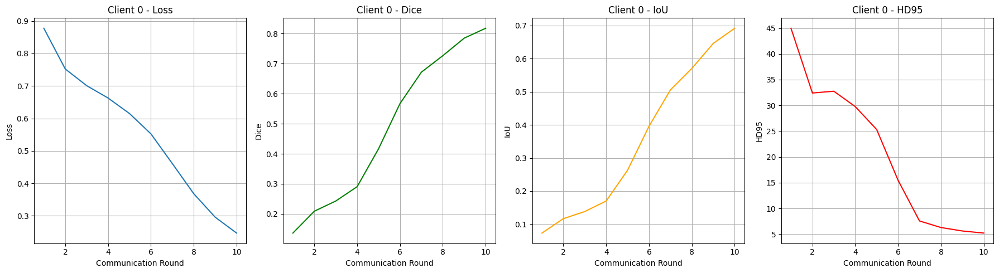

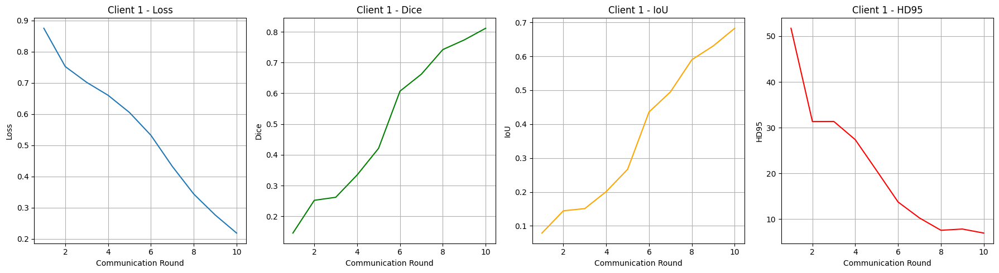

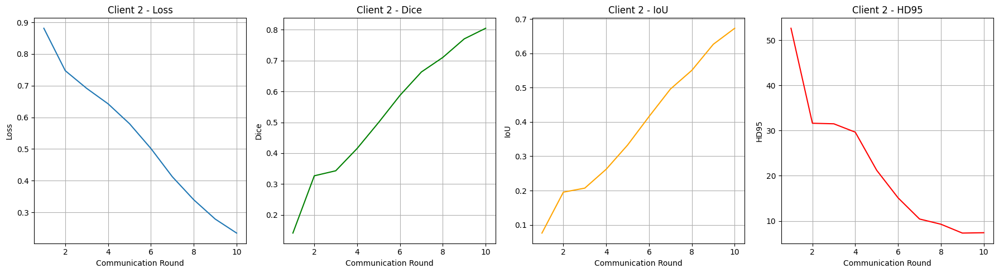

In [18]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

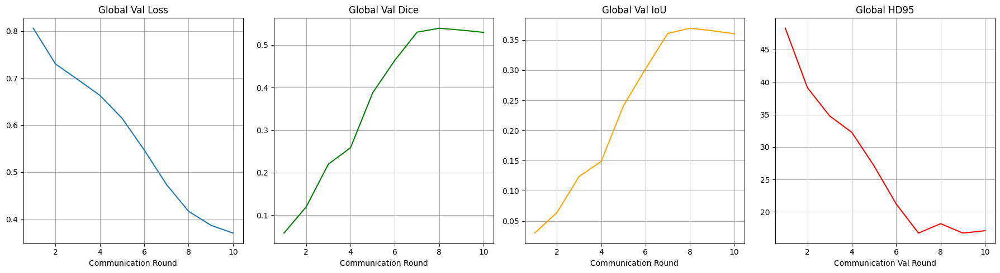

In [19]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [20]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_14292\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing:  52%|█████▏    | 26/50 [00:01<00:01, 15.73it/s, Dice=0.4361, IoU=0.2789, HD95=17.9688]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s, Dice=0.5122, IoU=0.3442, HD95=15.2051]


Test Set Metrics:
Dice: 0.5122
IoU: 0.3442
HD95: 15.2051


**Visualize**

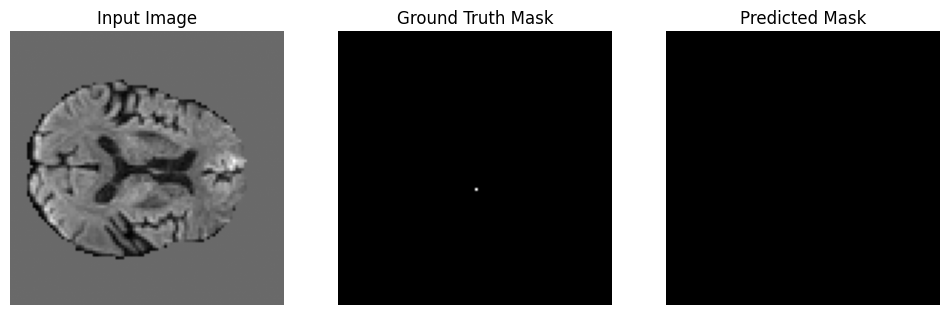

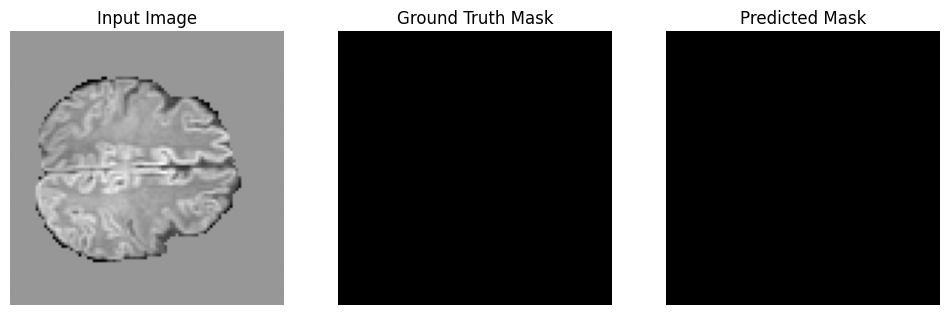

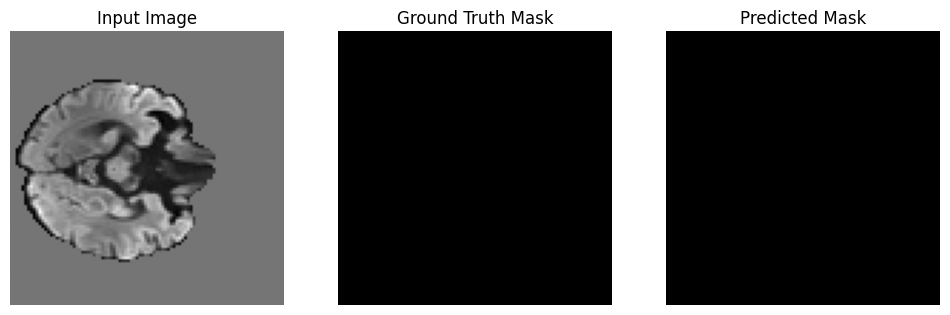

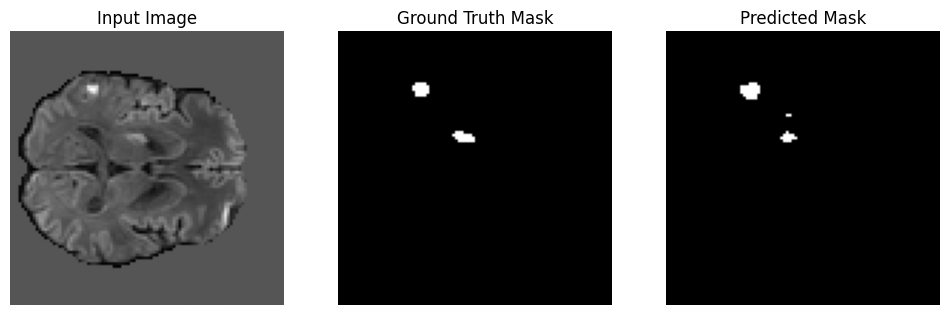

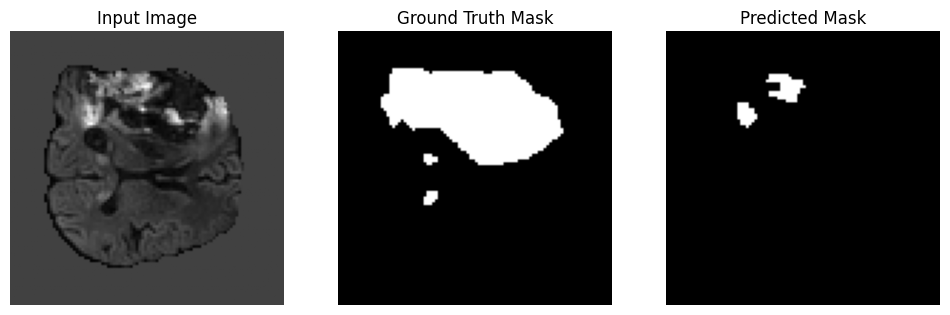

...

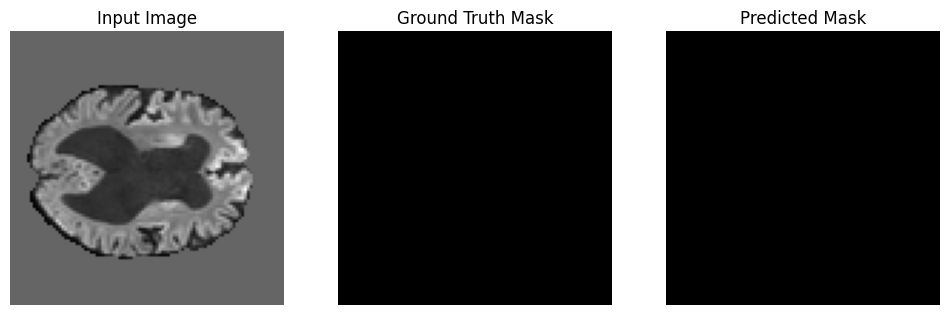

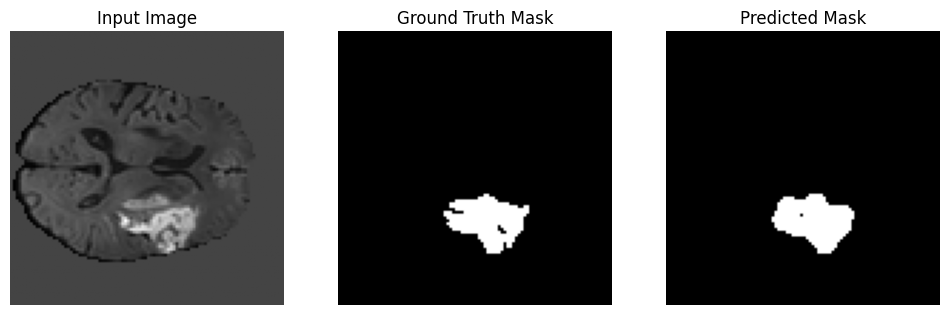

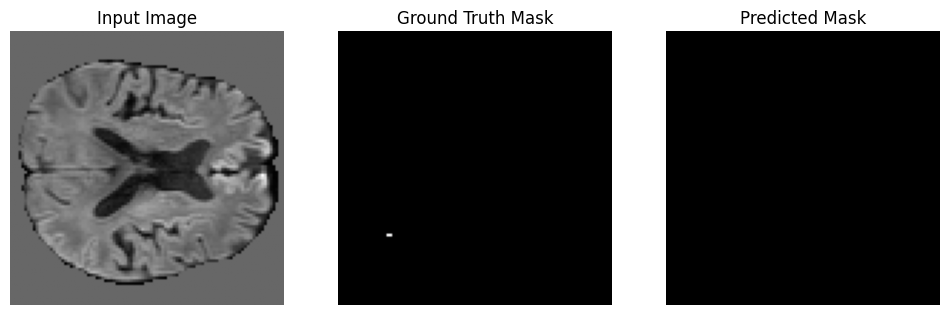

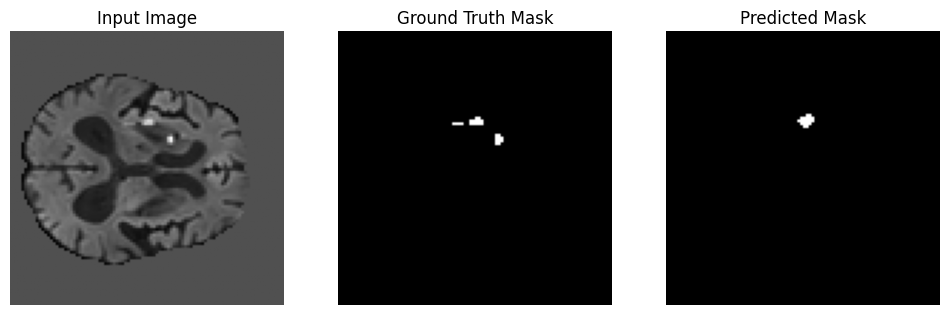

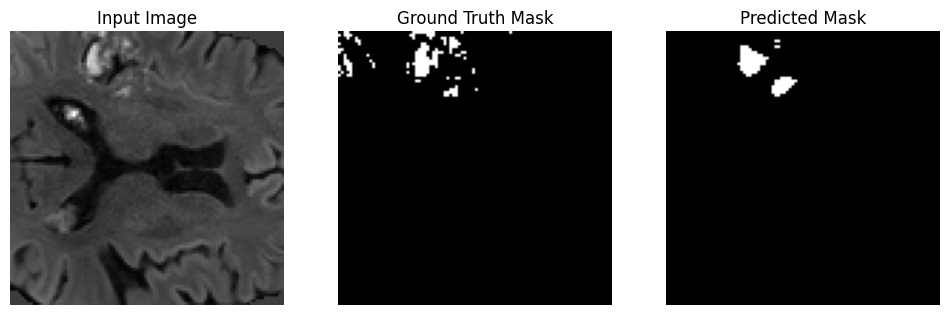

In [21]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()